In [25]:
import torch
import falcor
import time
import numpy as np
import pyexr as exr
import sys
import os
import dataclasses
import datetime
import glob
import argparse

sys.path.append(os.path.join(os.path.abspath(''), ".."))
import common
import material_utils
from loss import compute_render_loss_L1, compute_render_loss_L2


import common
import os
from falcor import Camera, float3
import copy
import numpy as np
from typing import List, Tuple

import torch
import numpy as np
import matplotlib.pyplot as plt
import time
from tqdm import tqdm

import json
try:
	import tinycudann as tcnn
except ImportError:
	print("This sample requires the tiny-cuda-nn extension for PyTorch.")
	print("You can install it by running:")
	print("============================================================")
	print("tiny-cuda-nn$ cd bindings/torch")
	print("tiny-cuda-nn/bindings/torch$ python setup.py install")
	print("============================================================")
	sys.exit()

In [26]:
import yaml

class ExperimentParams:
    def __init__(self):
        # Load the configuration from YAML file
        with open('config.yaml', 'r') as file:
            config = yaml.safe_load(file)['ExperimentParams']

        self.MODELS_PATH = config.get('MODELS_PATH')

params = ExperimentParams()
print(params.MODELS_PATH)  

E:/Models/


In [54]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as patches

def float3tonumpy(v):
    return np.array([v.x, v.y, v.z])

def numpytofloat3(n):
    return float3(*np.copy(n))


class ExperimentParams:
    render_width = 1280 # random
    render_height = 720
    # render_width = 400 # random
    # render_height = 300

    enable_MIS = False 
    enable_sky_learning = True # for example we could disable it and compare NIRC with NRC

    relative_error = False
    relative_error_eps = 0.001
    debug_width = 512 
    debug_height = 512

    GRADIENT_CLIP = 0.001
    SKIP_TENSOR_CHECK = False # disable if you have problems with NaNs, Inf or just 0 loss
    ADAM_BETAS = [0.98, 0.9999]
    ADAM_LR = 0.01
    OnlyLossEpoch = 1000
    num_training_frames = 150 # we gotta use the same number of training frames for all models to make conduct fair experiments!. USE a BIIG number for the final experiments (4k? 5k?)

    # MODELS_PATH = "E:/Models/" # we can just put it in the same folder as the script?
    MODELS_PATH = params.MODELS_PATH

    is_training = False



gparams = ExperimentParams()



class ValidationPoint:
    xn: float
    yn: float

    x: int
    y: int

    id: int
    
    position: np.ndarray
    target: np.ndarray
    normal: np.ndarray

    is_init: bool

    def __init__(self, xn: float, yn: float):
        self.xn = xn
        self.yn = yn

        self.x = int(gparams.render_width*xn)
        self.y = int(gparams.render_height*yn)

        self.id = self.y*gparams.render_width+self.x

        self.is_init = False


    def init_surface_data(self, p: np.ndarray, t: np.ndarray, n: np.ndarray):
        self.is_init = True

        self.position = p
        self.target = t
        self.n = n




class SceneConfig:
    model_path: str
    camera_position: np.ndarray
    camera_target: np.ndarray
    tonemapper_exposure: float
    focal_length: float
    
    validation_points: List[ValidationPoint]
    emissive_factor: float = 1.0
    

    def __init__(self, model_path: str, camera_position: Tuple[float, float, float], camera_target: Tuple[float, float, float], tonemapper_exposure: float = 0, focal_length: float = None, selected_points: List[Tuple[float, float]] = [], 
                 up: Tuple[float, float, float] = [0.0, 1.0, 0.0]):
        self.model_path = gparams.MODELS_PATH + model_path
        self.model_name = os.path.dirname(model_path)
        self.camera_position = np.array(camera_position)
        self.camera_target = np.array(camera_target)
        self.tonemapper_exposure = tonemapper_exposure
        self.checkpoint_dir = os.path.join('checkpoints', self.model_name)
        os.makedirs(self.checkpoint_dir, exist_ok=True)

        
        self.focal_length = focal_length
        self.validation_points = []
        self.up = up

        for p in selected_points:
            self.validation_points.append(ValidationPoint(xn=p[0], yn=p[1]))

    def camera_position_f3(self) -> float3:
        return numpytofloat3(self.camera_position)

    def camera_target_f3(self) -> float3:
        return numpytofloat3(self.camera_target)

    def __repr__(self) -> str:
        return f"SceneConfig(model_path={self.model_path}, camera_position={self.camera_position.tolist()}, camera_target={self.camera_target.tolist()}, tonemapper_exposure={self.tonemapper_exposure}, focal_length={self.focal_length})"

    def add_validation_point(self, p: Tuple[float, float]):
        self.validation_points.append(ValidationPoint(xn=p[0], yn=p[1]))

    def setup_validation_points(self, mlData):
        positions = mlData["worldpos"] 
        normals = mlData["normal"]

        for i in range(len(self.validation_points)):
            p = self.validation_points[i]
            pos = positions[p.id].cpu().numpy() # we should get it from the gpu torch in some way 
            normal = normals[p.id].cpu().numpy()

            p.init_surface_data(p = pos+normal*0.0000001, t = pos+normal, n = normal)
            
    def prepare_scene(self, scene, debugPointID=None):
        if debugPointID == None:
            scene.camera.position = numpytofloat3(self.camera_position)
            scene.camera.target = numpytofloat3(self.camera_target)
            if self.focal_length != None:
                scene.camera.focalLength = self.focal_length
            scene.camera.useHemisphericalCamera = False
            scene.camera.up = numpytofloat3(self.up)
        else:
            vp = self.validation_points[debugPointID]
            scene.camera.useHemisphericalCamera = True
            scene.camera.position = numpytofloat3(vp.position)
            scene.camera.target = numpytofloat3(vp.target)
            scene.camera.up = numpytofloat3(self.up)
            assert(vp.is_init)

# some specular scenes? we could just import the specular sponza
scenes = {
    #"CornellBox": SceneConfig("CornellBox/cornell_box.pyscene", camera_position=[0, 0.28, 0.6], camera_target=[0, 0.28, 0], selected_points=[[0.35, 0.5], [0.65, 0.4]]),
    "CornellBox": SceneConfig("CornellBox/cornell_box.pyscene", camera_position=[0, 0.28, 1.2], camera_target=[0, 0.28, 0], selected_points=[[0.35, 0.5], [0.65, 0.4]]),
    "Bistro" : SceneConfig("Bistro/BistroExterior.pyscene", camera_position=[-29.195, 5.145, -8.768], camera_target=[-28.212, 5.137, -8.586], selected_points=[[0.35, 0.5], [0.65, 0.4]]),
    "CountryKitchen": SceneConfig("CountryKitchen/Country-Kitchen.gltf", camera_position=[1.456, 1.509, 1.602], camera_target=[0.678, 1.471, 0.974], selected_points=[[0.35, 0.5], [0.65, 0.4]]),
    "SanMiguel": SceneConfig("SanMiguel/san-miguel.pyscene", camera_position=[22.2190, 3.3300, 6.7120], camera_target=[21.5799, 3.3054, 5.9432], selected_points=[[0.35, 0.5], [0.65, 0.4]], focal_length=17.750),
    "TheWhiteRoomCycles": SceneConfig("TheWhiteRoomCycles/the-white-room_0001.gltf", camera_position=[2.781, 1.247, 5.251], camera_target=[2.151, 1.195, 4.477], selected_points=[[0.35, 0.5], [0.65, 0.4]]),
    "Sponza": SceneConfig("Sponza/Sponza.pyscene", camera_position=[8.084, 1.708, 0.827], camera_target=[7.091, 1.684, 0.715], selected_points=[[0.5, 0.1], [0.65, 0.2]], focal_length=16.750) 
}


## Scene Select

In [28]:
scene_cfg = scenes["Bistro"]

In [29]:
CUR_DIR = os.path.abspath('')
sys.path.append(os.path.join(CUR_DIR, ".."))


output_dir = CUR_DIR + "/results/"


device_id = 0
testbed = common.create_testbed([gparams.render_width, gparams.render_height])
device = testbed.device


# Load the reference scene.
ref_scene = common.load_scene(
    testbed,
    scene_cfg.model_path,
    gparams.render_width / gparams.render_height,
)


# I don't know why but useAnalyticLights and useEnvLight have False value if we start the renderer from the python side. haven't managed to found the root of this bizarre behaviour. it must be a bug -> TO DO: MAKE SURE and REPORT ABOUT IT!!
ref_scene.renderSettings = falcor.SceneRenderSettings(useEnvLight=True, useAnalyticLights=True, useEmissiveLights=True, useGridVolumes=True)


# init structure buffers that we need for ML side
field_types = {"radiance": "float3", "dir": "float3", "thp": "float3", "worldpos": "float3", "normal": "float3", "color": "float3", "dradiance": "float3", "roughness": "float", "pdf": "float"}
ml_data = device.create_structured_buffer(
    struct_size = 12*7+4*2,
    element_count=gparams.render_width*gparams.render_height,
    bind_flags=falcor.ResourceBindFlags.ShaderResource  
    | falcor.ResourceBindFlags.UnorderedAccess
    | falcor.ResourceBindFlags.Shared
)


rays_fields = {"worldpos": "float3", "dir": "float3"}
ml_rays_data = device.create_structured_buffer(
    struct_size = 12*2,
    element_count=gparams.render_width*gparams.render_height,
    bind_flags=falcor.ResourceBindFlags.ShaderResource  
    | falcor.ResourceBindFlags.UnorderedAccess
    | falcor.ResourceBindFlags.Shared
)


device.render_context.wait_for_falcor()

In [30]:
render_graph = testbed.create_render_graph("StandardPathTracer")

# Create the PathTracer pass.
path_tracer_pass = render_graph.create_pass(
    "PathTracer",
    "PathTracer",
    {
        "samplesPerPixel": 1, "useSER": False, "useMIS": gparams.enable_MIS
    }
)

# Create the VBufferRT pass.
vbuffer_rt_pass = render_graph.create_pass(
    "VBufferRT",
    "VBufferRT",
    {
        "samplePattern": "Center",
        "sampleCount": 1,
        "useAlphaTest": True
    }
)

AccumulatePass = render_graph.createPass("AccumulatePass", "AccumulatePass", {'enabled': True, 'precisionMode': 'Single'})
ToneMapper = render_graph.createPass("ToneMapper", "ToneMapper", {'autoExposure': False, 'exposureCompensation': 0.0, 'outputFormat': 'RGBA32Float' }) 

# Add edges to connect the passes.
render_graph.add_edge("VBufferRT.vbuffer", "PathTracer.vbuffer")
render_graph.add_edge("VBufferRT.viewW", "PathTracer.viewW")
render_graph.add_edge("VBufferRT.mvec", "PathTracer.mvec")

render_graph.addEdge("PathTracer.color", "AccumulatePass.input")
render_graph.addEdge("AccumulatePass.output", "ToneMapper.src")


# Mark the output of the PathTracer pass.
render_graph.markOutput("ToneMapper.dst")
render_graph.mark_output("AccumulatePass.output")
render_graph.mark_output("PathTracer.color")

# Assign the configured render graph to the testbed.
testbed.render_graph = render_graph

path_tracer_pass.mlData = ml_data
vbuffer_rt_pass.mlRaysData = ml_rays_data


In [31]:
scene_cfg.prepare_scene(ref_scene)

In [32]:
import matplotlib.pyplot as plt 


def adjust_gamma(image, gamma=2.2):
	return (image )**(1 / gamma)


def frameRender(num_samples=1024, vis = True, tonemapped=False,  directEmissive=True, directSky=True):
    # may take some time to recompile the shaders becase of changed defines
    AccumulatePass.reset()
    AccumulatePass.enabled = True
    vbuffer_rt_pass.sampleCount = 16
    
    path_tracer_pass.useMIS = True
    path_tracer_pass.mlTraining = False
    path_tracer_pass.directEmissive = directEmissive
    path_tracer_pass.directSky = directSky

    for _ in range(num_samples):
        testbed.frame()

    if tonemapped:
        img = testbed.render_graph.get_output("ToneMapper.dst").to_numpy()[:, :, :3]
        img = adjust_gamma(img)
    else:
        img = testbed.render_graph.get_output("AccumulatePass.output").to_numpy()[:, :, :3]
    if not vis:
        return img


    plt.imshow(img)

    path_tracer_pass.directEmissive = True
    path_tracer_pass.directSky = True
    path_tracer_pass.useMIS = gparams.enable_MIS 
    vbuffer_rt_pass.sampleCount = 1
    AccumulatePass.enabled = False
    return img

In [33]:
def trainFrame():
    path_tracer_pass.useMIS = False
    path_tracer_pass.indirectSky = gparams.enable_sky_learning
    path_tracer_pass.mlTraining = True
    testbed.frame()
    path_tracer_pass.useMIS = True
    path_tracer_pass.indirectSky = True
    path_tracer_pass.mlTraining = False


In [34]:
#testbed.end_frame_forced()

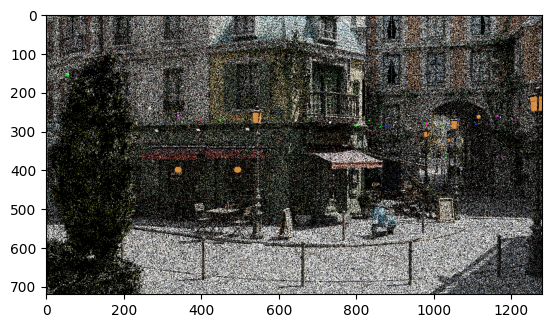

In [35]:
# feel free to remove it

im = frameRender(num_samples = 1, vis=True, tonemapped=True)
# this should produce a converged render from the correct camera viewpoint (+- as in the paper teaser)

In [36]:
def falcor_to_torch(buffer: falcor.Buffer, dtype=torch.float32):
    params = torch.tensor([0]*(buffer.element_count*12), dtype=dtype)
    buffer.copy_to_torch(params)
    device.render_context.wait_for_cuda()
    return params

In [37]:
def extract_field(data, start, struct_size, field_size):
    return torch.cat([data[i:i + field_size] for i in range(start, data.numel(), struct_size)])

def falcor_to_torch_split_interleaved(buffer, field_types, dtype=torch.float32):
    # Size mapping for different types (add more types if needed)
    size_mapping = {
        "float3": 3,  # 3 floats in a float3
        "float": 1
    }

    # Calculate the size of one complete set of fields
    struct_size = sum(size_mapping[field_type] for field_type in field_types.values())
    # Calculate the total size of the tensor
    total_size = struct_size * buffer.element_count    
    all_data = buffer.to_torch([total_size])
    device.render_context.wait_for_cuda()

    # Splitting the tensor into separate tensors for each field considering interleaved structure
    tensors = {}
    offset = 0
    for i, (field_name, field_type) in enumerate(field_types.items()):
        field_size  = size_mapping[field_type]

        # Reshaping data
        reshaped_data = all_data.view(-1, struct_size)
        # Extracting field without using a loop
        tensors[field_name] = reshaped_data[:, offset: offset + field_size]
        offset += field_size

    return tensors


In [38]:
mlDataOutput = falcor_to_torch_split_interleaved(ml_data, field_types)
mlDataRaysOutput = falcor_to_torch_split_interleaved(ml_rays_data, rays_fields)

In [39]:
mlDataOutput_ref = {k: v.clone() for k, v in mlDataOutput.items()}
mlDataRaysOutput_ref = {k: v.clone() for k, v in mlDataRaysOutput.items()}

In [40]:
# we gotta inform the validation points about the corresponding surface parameters (where we're gonna capute the hemispherical incident light visualization) 
scene_cfg.setup_validation_points(mlDataOutput_ref)

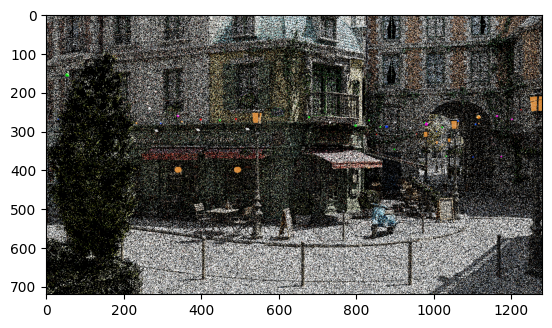

In [41]:
scene_cfg.prepare_scene(ref_scene, debugPointID=None)
gt_render = frameRender(num_samples=1, tonemapped=True)

In [42]:

def check_tensor(tensor, tensor_name="Tensor", force_analyze=False, min=None, max=None):
    if gparams.SKIP_TENSOR_CHECK and not force_analyze:
        return 1
    """
    Check if the given tensor contains any NaN or Inf values and print a specific message.

    Args:
    tensor (torch.Tensor): The tensor to check.
    tensor_name (str): The name of the tensor to display in messages.
    """
    has_nan = torch.isnan(tensor).any().item()  # Check for any NaNs and convert to Python bool
    has_inf = torch.isinf(tensor).any().item()  # Check for any Infs and convert to Python bool


    good = True
    # Print relevant messages based on the tensor's content
    if has_nan and has_inf:
        print(f"{tensor_name} contains both NaN and Inf values.")
        good = False
    elif has_nan:
        print(f"{tensor_name} contains NaN values.")
        good = False
    elif has_inf:
        print(f"{tensor_name} contains Inf values.")
        good = False


    
    if min is not None and torch.all(tensor >= min).item() is False:
        good = False
        print(f"{tensor_name} is smaller than {min}")
        
    if max is not None and torch.all(tensor <= max).item() is False:
        good = False
        print(f"{tensor_name} is bigger than {max}")


    if good and not force_analyze:
        return True

    # Checking for NaNs and Infs
    has_nan = torch.isnan(tensor).any().item()
    has_inf = torch.isinf(tensor).any().item()
    print("Contains NaN values:", has_nan)
    print("Contains Inf values:", has_inf)
    
    # Basic statistics
    tensor_min = torch.min(tensor).item()
    tensor_max = torch.max(tensor).item()
    tensor_mean = torch.mean(tensor.float()).item()  # Ensure tensor is float for mean calculation
    print("Minimum value:", tensor_min)
    print("Maximum value:", tensor_max)
    print("Average value:", tensor_mean)
    
    # Histogram of the tensor values
    tensor_np = tensor.detach().cpu().numpy()  # Convert tensor to NumPy array for histogram
    plt.figure(figsize=(10, 4))
    plt.hist(tensor_np.ravel(), bins=100, color='blue', alpha=0.7)  # Flatten the tensor and plot
    plt.title(f"Histogram of {tensor_name} with shape {tensor.shape}")
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()
    
    return good

In [43]:
default_mask = (mlDataOutput_ref["radiance"] >= 0.0).all(dim=1)

def get_mask_for_training(rad, default_mask_use=True):
    active_pixel_mask = (rad >= 0).all(dim=1)
    nan_mask = torch.isnan(rad).any(dim=1)  # Creates a mask of rows with any NaNs
    inf_mask = torch.isinf(rad).any(dim=1)  # Creates a mask of rows with any NaNs
    non_nan_mask = ~nan_mask
    non_inf_mask = ~inf_mask
    non_nan_mask = (non_nan_mask & active_pixel_mask) & non_inf_mask
    if default_mask_use:
        non_nan_mask = default_mask & non_nan_mask
    return non_nan_mask

In [44]:
device_t = torch.device("cuda")

In [45]:
def packModelInput(dposition, ddir, dcolor, droughness, dnormal):

    if ddir is not None:
        norm = (torch.square(torch.sum(ddir**2, dim=1))+1.0e-10)
        norm = torch.unsqueeze(norm, dim=1)
        ddir = ddir/norm
        dirs = ddir*0.5+0.5
        
    normals = cart_to_sph(dnormal)

    # torch.Size([3])
    scene_min = torch.tensor(float3tonumpy(ref_scene.bounds.min_point), device="cuda:0")
    scene_max = torch.tensor(float3tonumpy(ref_scene.bounds.max_point), device="cuda:0")

    #torch.Size([147600, 3])
    positions = (dposition-scene_min)/(scene_max-scene_min)

    if ddir is not None:
        assert(check_tensor(dirs, "dirs"))

    assert(check_tensor(normals, "normals"))
    assert(check_tensor(positions, "positions"))
    assert(check_tensor(dcolor, "dcolor"))
    assert(check_tensor(droughness, "droughness"))

    if ddir is not None:
        return torch.cat((normals, positions, droughness, dcolor, dirs), dim=1)
    else:
        return torch.cat((normals, positions, droughness, dcolor), dim=1) # positions two times, idk why it doesnt work with out it!!!!!! TO DO
        


def aces_tonemap(image, exposure=1.0):
    """
    ACES tonemapping function.
    :param image: Input HDR image.
    :param exposure: Exposure factor.
    :return: Tonemapped image.
    """
    a = 2.51
    b = 0.03
    c = 2.43
    d = 0.59
    e = 0.14

    mapped = exposure * image
    return ((mapped * (a * mapped + b)) / (mapped * (c * mapped + d) + e))


def apply_gamma_correction(image):
    """
    Applies gamma correction to the image.
    :param image: Input image to correct.
    :return: Gamma corrected image.
    """
    gamma = 2.2
    return np.power(image, 1.0 / gamma)


def cart_to_sph(tensor):
    theta = torch.acos(tensor[:,2])  # arccos(z/r)
    phi = torch.atan2(tensor[:,1], tensor[:,0])  # arctan(y/x)

    theta = theta / torch.tensor(np.pi)
    phi = (phi/torch.tensor(np.pi))*0.5 + 0.5
    return torch.stack([theta, phi], dim=1)


def vectorized_uniform_stratified_sampling(width, height, tile_width, tile_height):
    # Calculate the number of tiles in each dimension
    num_tiles_x = width // tile_width
    num_tiles_y = height // tile_height

    # Generate grid indices for tiles
    tiles_x = torch.arange(num_tiles_x).repeat(num_tiles_y)
    tiles_y = torch.arange(num_tiles_y).repeat_interleave(num_tiles_x)

    # Generate random points within each tile
    points_within_tile_x = torch.randint(0, tile_width, (num_tiles_x * num_tiles_y,))
    points_within_tile_y = torch.randint(0, tile_height, (num_tiles_x * num_tiles_y,))

    # Calculate global indices
    global_indices = ((tiles_y * tile_height + points_within_tile_y) * width + (tiles_x * tile_width + points_within_tile_x))

    return global_indices

In [46]:
import os
import time
import torch
import numpy as np
import matplotlib.pyplot as plt
import json
import math

import os
import torch

import torch.nn as nn

def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
    
def l2_regularization(model, lambda_l2):
    l2_loss = torch.tensor(0.0).to(device_t)
    for param in model.parameters():
        l2_loss += torch.norm(param)**2
    return lambda_l2 * l2_loss

# assume one pdf for both prediction and ref, that these samples have been already divided by pdf!! pdf must be 1 for delta surfaces!!
def relativeL2(prediction, ref, pdf=None, eps=None, div=None):
    eps = gparams.relative_error_eps if eps is None else eps
    div = prediction.detach() if div is None else div
    denominator = torch.mean(prediction.detach(), dim=1).view(-1,1)**2 +eps
    

    rL2 = (pdf*((prediction - ref))**2) / denominator
    rL2 = rL2[~(torch.isinf(rL2) | torch.isnan(rL2))]
    rL2 = rL2.mean()
    return rL2 


# we transform delta pdfs from 0 to 1.0
def safe_pdf(pdf):
    pdf = torch.where(pdf <= 0.000000000, torch.tensor(1.0), pdf)
    return pdf

# assume pne pdf for both prediction and ref, but only ref has been divided by pdf 
def relativeL2_PDF_NotApplied(prediction, ref, pdf=None, eps=None, div=None):
    eps = gparams.relative_error_eps if eps is None else eps
    div = prediction.detach() if div is None else div
    denominator = torch.mean(prediction.detach(), dim=1).view(-1,1)**2 +eps
    sqrt_pdf = torch.sqrt(pdf)

    rL2 = (((prediction - ref*pdf))**2) / (denominator*pdf)
    rL2 = rL2[~(torch.isinf(rL2) | torch.isnan(rL2))]
    rL2 = rL2.mean()
    return rL2 


def L2(prediction, ref, pdf=1):
    rL2 = pdf*(prediction - ref)**2
    rL2 = rL2.mean()
    return rL2 

# model(X).cpu()
def visualize_model_output(Y, width, height, epoch):
    with torch.no_grad():
        output = Y.numpy().astype(np.float32)
        output_image = output.reshape(height, width, 3)
        output_image = output_image
        
        plt.imshow(output_image)
        plt.title(f'Model Output at Epoch {epoch + 1}')
        plt.show()

# Function to determine if visualization should occur at the current epoch
def should_visualize(epoch, conditions):
    for max_epoch, interval in conditions:
        if epoch < max_epoch:
            return (epoch + 1) % interval == 0
    return (epoch + 1) % 200 == 0

class LambdaLayer(torch.nn.Module):
    def __init__(self, func):
        super(LambdaLayer, self).__init__()
        self.func = func

    def forward(self, x):
        return self.func(x)

# Define the MLP class
class MLP(nn.Module):
    def __init__(self, input_dim, output_dim, hidden_dim=64, num_layers=6):
        super(MLP, self).__init__()
        layers = []
        for _ in range(num_layers):
            layers.append(nn.Linear(input_dim, hidden_dim))
            layers.append(nn.ReLU())
            input_dim = hidden_dim
        layers.append(nn.Linear(hidden_dim, output_dim))
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Loaded cached ref_estimations from checkpoint.


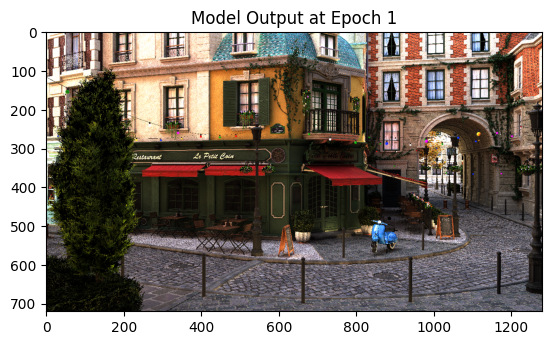

In [47]:


# Initialize the ref_estimations tensor with zeros of required shape
ref_estimations = torch.zeros((gparams.render_width, gparams.render_height, 3), device=device_t)

# Checkpoint path
checkpoint_path = os.path.join(scene_cfg.checkpoint_dir, f'ref_estimations_{gparams.render_width}x{gparams.render_height}.pth')

# Try to load cached ref_estimations if it exists


found = False


if os.path.exists(checkpoint_path):
    found = True
    ref_estimations = torch.load(checkpoint_path, map_location=device_t)
    print("Loaded cached ref_estimations from checkpoint.")
else:
    print("No cached ref_estimations found. Initializing new tensor.")

scene_cfg.prepare_scene(ref_scene)


if not found:
    for epoch in range(4000):
        start_render = time.time()
        # Render a new frame each epoch
        trainFrame()

        # Get the newly rendered data
        mlDataOutput = falcor_to_torch_split_interleaved(ml_data, field_types)

        y = mlDataOutput["radiance"]
        thp = mlDataOutput["thp"]

        y = y.clone()  # Make a copy of the tensor
        y = y * thp

        if epoch == 0:
            ref_estimations = y
        else:
            a = 1.0 / epoch
            ref_estimations = y * a + ref_estimations * (1.0 - a)

        # Save the ref_estimations tensor every 100 epochs
        if (epoch + 1) % 100 == 0:
            torch.save(ref_estimations, checkpoint_path)
            print(f"Saved ref_estimations at epoch {epoch + 1}.")

        if (epoch + 1) % 1000 == 0:
            visualize_model_output(ref_estimations.cpu(), gparams.render_width, gparams.render_height, epoch)
else:
    visualize_model_output(ref_estimations.cpu(), gparams.render_width, gparams.render_height, 0)

# ALL MODELS


## NRC

In [48]:
# class NRC_Model(torch.nn.Module):
#     def __init__(self, config_path, device):
#         super(NRC_Model, self).__init__()
#         with open(config_path) as config_file:
#             config = json.load(config_file)
        
#         encoding = tcnn.Encoding(n_input_dims, config["encoding"])
#         network = tcnn.Network(encoding.n_output_dims, n_output_dims, config["network"])
#         model = torch.nn.Sequential(encoding, network)

#         self.model = tcnn.NetworkWithInputEncoding(
#             n_input_dims=12, 
#             n_output_dims=3, 
#             encoding_config=config["encoding"], 
#             network_config=config["network"]
#         ).to(device)
#         self.optimizer = torch.optim.Adam(self.model.parameters(), lr=0.001, betas=[0.9, 0.99], eps=1e-16)
#         self.checkpoint_path = None
#         self.device = device
#         self.rL2 = None

#     def set_checkpoint_path(self, checkpoint_dir):
#         os.makedirs(checkpoint_dir, exist_ok=True)
#         self.checkpoint_path = os.path.join(checkpoint_dir, f'nrc_checkpoint.pth')

#     def save_checkpoint(self, epoch, loss):
#         if self.checkpoint_path:
#             torch.save({
#                 'epoch': epoch,
#                 'model_state_dict': self.model.state_dict(),
#                 'optimizer_state_dict': self.optimizer.state_dict(),
#                 'loss': loss,
#                 'rL2': self.rL2,
#             }, self.checkpoint_path)

#     def load_checkpoint(self, skip=False):
#         if not skip and self.checkpoint_path and os.path.exists(self.checkpoint_path):
#             checkpoint = torch.load(self.checkpoint_path)
#             self.model.load_state_dict(checkpoint['model_state_dict'])
#             self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
#             epoch = checkpoint['epoch']
#             loss = checkpoint['loss']
#             self.rL2 = checkpoint['rL2']
            
#             print(f"Checkpoint loaded: Epoch {epoch}, Loss {loss}")
#             return epoch, loss
#         else:
#             return 0, None

#     def forward(self, x, color, d_radiance=0):
#         return self.model(x)*color+d_radiance

#     def prepare_input(self, mlDataOutput, camera_position_tensor):
#         pdf = mlDataOutput["pdf"]
#         view_vectors = camera_position_tensor - mlDataOutput["worldpos"]
#         norm_view_vectors = view_vectors / torch.norm(view_vectors, dim=1, keepdim=True)
#         X = packModelInput(mlDataOutput["worldpos"], norm_view_vectors, mlDataOutput["color"], mlDataOutput["roughness"], mlDataOutput["normal"])
#         return X, pdf


# # Assuming scene_cfg, gparams, ml_data, and other necessary variables are properly defined
# scene_cfg.prepare_scene(ref_scene)

# # Initialize NRC_Model
# nrc_model = NRC_Model(config_path="data/nrc.json", device=device_t)
# nrc_model.set_checkpoint_path(scene_cfg.checkpoint_dir)

# # Load checkpoint if it exists
# start_epoch, _ = nrc_model.load_checkpoint(skip=False)

# # Training parameters
# N = gparams.num_training_frames  # number of epochs
# B = 16  # number of batches
# simulate_tiles = False  # like in the original NRC work
# tile_width, tile_height = 4, 4  # Sampling one point per 2x2 tile
# eps = 0.001
# lambda_l2 = 0.00000001  # Weight for L2 regularization
# L2Reg = False

# # Enter training mode
# nrc_model.train()

# # Convert camera position to PyTorch tensor
# camera_position_tensor = torch.tensor(scene_cfg.camera_position, dtype=torch.float32).to(device_t)

# relative_error = True

# N = 0


# for epoch in range(start_epoch, N):
#     start_render = time.time()
#     # Render a new frame each epoch
#     trainFrame()
#     # Get the newly rendered data
#     mlDataOutput = falcor_to_torch_split_interleaved(ml_data, field_types)

#     thp = mlDataOutput["thp"]
#     render_time = time.time() - start_render

#     # Prepare inputs using the new method
#     X, pdf = nrc_model.prepare_input(mlDataOutput, camera_position_tensor)

#     color = mlDataOutput["color"]
#     y = mlDataOutput["radiance"].clone()  # Clone to manage memory

#     direct_radiance =  mlDataOutput["dradiance"]

#     # y = y*thp

#     width, height = gparams.render_width, gparams.render_height
#     total_samples = X.size()[0]
#     samples_per_batch = total_samples // B

#     for batch_index in range(B):
#         nrc_model.optimizer.zero_grad()

#         # Apply tiling to the current batch
#         batch_indices = vectorized_uniform_stratified_sampling(width, height, tile_width, tile_height)
#         batch_indices = batch_indices[:samples_per_batch]  # Ensure the batch size matches

#         batch_x = X[batch_indices]
#         batch_y = y[batch_indices]
#         batch_pdf = pdf[batch_indices]

#         mask = get_mask_for_training(batch_y, False)
#         batch_y = batch_y[mask]
#         batch_x = batch_x[mask]
#         batch_pdf = batch_pdf[mask]
#         batch_color = color[batch_indices][mask]
#         # Forward pass
#         outputs = nrc_model(batch_x, batch_color)
#         denominator = torch.norm(outputs.detach(), dim=1).view(-1,1) + gparams.relative_error_eps if gparams.relative_error else 1.0
#         loss = ((outputs - batch_y)**2 / denominator).mean()
#         # Add L2 regularization if enabled
#         total_loss = loss


#         denominator = torch.norm(ref_estimations[batch_indices][mask], dim=1).view(-1,1)+gparams.relative_error_eps
#         nrc_model.rL2 = ((outputs.detach() - batch_y)**2 / denominator).mean()


#         # Backward and optimize
#         total_loss.backward()
#         torch.nn.utils.clip_grad_norm_(nrc_model.model.parameters(), 1000)  # Clipping gradients to avoid explosion
#         nrc_model.optimizer.step()

#     # Reporting
#     if epoch == start_epoch:
#         average_loss = loss.item()
#     else:
#         alpha = 0.95
#         average_loss = average_loss * alpha + (1.0 - alpha) * loss.item()

#     if (epoch + 1) % 5 == 0:
#         print(f'Epoch [{epoch + 1}/{N}], AveragedLoss: {average_loss}, Loss: {loss.item()}, rL2_loss: {nrc_model.rL2}')

#     if (epoch + 1) % 500 == 0:
#         nrc_model.eval()
#         visualize_model_output(nrc_model(X, color).cpu(), gparams.render_width, gparams.render_height, epoch)
#         nrc_model.train()


#     if (epoch + 1) % 100 == 0:
#         nrc_model.save_checkpoint(epoch, average_loss)


NameError: name 'n_input_dims' is not defined

## NIRC

NN params 10060355
Checkpoint loaded: Epoch 299, Loss 1.8376764168314978


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [300/300], AveragedLoss: 4.940732479095459, Loss: 4.940732479095459, rL2_loss: 4.847139144841134


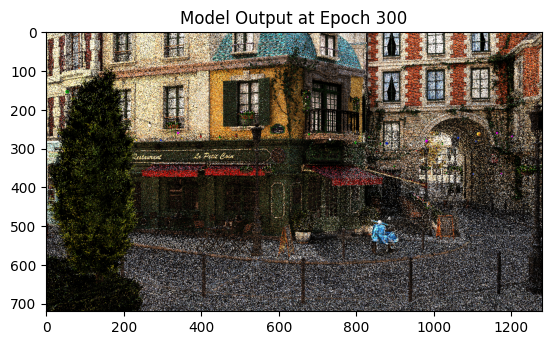

Epoch [305/300], AveragedLoss: 4.511302368725912, Loss: 2.750786066055298, rL2_loss: 4.076766857504846
Epoch [310/300], AveragedLoss: 4.36839029753896, Loss: 2.500073194503784, rL2_loss: 4.023637425154449
Epoch [315/300], AveragedLoss: 4.021923507044642, Loss: 2.276632308959961, rL2_loss: 3.738644371926787
Epoch [320/300], AveragedLoss: 3.8531694743515486, Loss: 2.364964008331299, rL2_loss: 5.080964921042323
Epoch [325/300], AveragedLoss: 4.2209391324281285, Loss: 3.621025562286377, rL2_loss: 4.95022799909115
Epoch [330/300], AveragedLoss: 4.000964836374132, Loss: 2.5861244201660156, rL2_loss: 5.215217467149098
Epoch [335/300], AveragedLoss: 3.75352652569896, Loss: 3.4972832202911377, rL2_loss: 4.9072399384209096
Epoch [340/300], AveragedLoss: 3.5489600064474045, Loss: 2.4005937576293945, rL2_loss: 4.741829412057996
Epoch [345/300], AveragedLoss: 5.584055576565766, Loss: 18.500463485717773, rL2_loss: 4.823972720901171
Epoch [350/300], AveragedLoss: 5.020889655747743, Loss: 2.4090516567

In [56]:

class NIRC_Model(torch.nn.Module):
    def __init__(self, width, height, config_path, device, init_method='xavier'):
        super(NIRC_Model, self).__init__()
        
        with open(config_path) as config_file:
            config = json.load(config_file)

        
        encoding = tcnn.Encoding(12, config["encoding"]).to(device)
        halftofloat = LambdaLayer(lambda x: x.float())
        mlp = MLP(encoding.n_output_dims, 3).to(device)
        self.model = torch.nn.Sequential(encoding, halftofloat, mlp)
        

        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=0.001, betas=[0.9, 0.99], eps=1e-15)
        self.scheduler = torch.optim.lr_scheduler.StepLR(self.optimizer, step_size=200, gamma=0.5)
        print(f"NN params {count_parameters(self.model)}")
        self.checkpoint_path = None
        self.device = device
        self.rL2 = 0


    def set_checkpoint_path(self, checkpoint_dir):
        os.makedirs(checkpoint_dir, exist_ok=True)
        self.checkpoint_path = os.path.join(checkpoint_dir, f'nirc_checkpoint.pth')

    def save_checkpoint(self, epoch, loss):
        if self.checkpoint_path and not math.isnan(loss) and not math.isinf(loss) and loss > 0:
            torch.save({
                'epoch': epoch,
                'model_state_dict': self.model.state_dict(),
                'optimizer_state_dict': self.optimizer.state_dict(),
                'loss': loss,
                'rL2': self.rL2,
            }, self.checkpoint_path)

    def load_checkpoint(self, skip=False):
        if not skip and self.checkpoint_path and os.path.exists(self.checkpoint_path):
            checkpoint = torch.load(self.checkpoint_path)
            self.model.load_state_dict(checkpoint['model_state_dict'])
            self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
            epoch = checkpoint['epoch']
            loss = checkpoint['loss']
            self.rL2 = checkpoint['rL2']
            
            print(f"Checkpoint loaded: Epoch {epoch}, Loss {self.rL2 }")
            return epoch, loss
        else:
            return 0, None

    def forward(self, x, thp):
        return torch.relu(self.model(x))*thp
    
    def prepare_input_(self, dposition, ddir, dcolor, droughness, dnormal):
        norm = (torch.sqrt(torch.sum(ddir**2, dim=1))+0.000000001)
        norm = torch.unsqueeze(norm, dim=1)
        ddir = ddir/norm
        dirs = ddir*0.5+0.5
            
        normals =  dnormal
        normals = cart_to_sph(normals)

        # torch.Size([3])
        scene_min = torch.tensor(float3tonumpy(ref_scene.bounds.min_point), device="cuda:0")
        scene_max = torch.tensor(float3tonumpy(ref_scene.bounds.max_point), device="cuda:0")

        #torch.Size([147600, 3])
        positions = (dposition-scene_min)/(scene_max-scene_min)

        assert(check_tensor(dirs, "dirs"))
        assert(check_tensor(normals, "normals"))
        assert(check_tensor(positions, "positions"))
        assert(check_tensor(dcolor, "dcolor"))
        assert(check_tensor(droughness, "droughness"))

        return torch.cat((normals, positions, droughness, dcolor, dirs), dim=1)


    def prepare_input(self, mlDataOutput):
        return self.prepare_input_(mlDataOutput["worldpos"]+0.0, mlDataOutput["dir"]+0.0, mlDataOutput["color"]+0.0, mlDataOutput["roughness"]+0.0, mlDataOutput["normal"]+0.0)
        

# Assuming scene_cfg, gparams, ml_data, and other necessary variables are properly defined
scene_cfg.prepare_scene(ref_scene)

# Initialize NIRC_Model
nirc_model = NIRC_Model(init_method='default', config_path="data/nirc.json", width=gparams.render_width, height=gparams.render_height, device=device_t)
nirc_model.set_checkpoint_path(scene_cfg.checkpoint_dir)

# Load checkpoint if it exists
start_epoch, _ = nirc_model.load_checkpoint(skip=False)

# Training parameters
N = 300  # number of epochs
B = 16  # batch size
simulate_tiles = False  # like in the original NRC work
tile_width, tile_height = 4, 4  # Sampling one point per 2x2 tile
eps = 0.005
lambda_l2 = 0.00000001  # Weight for L2 regularization
L2Reg = False


# Enter training mode
nirc_model.train()
if start_epoch > N:
    start_epoch = N
    nirc_model.rL2 = 0
re_accum = 1
for epoch in range(start_epoch, N + gparams.OnlyLossEpoch):
    start_render = time.time()
    # Render a new frame each epoch
    trainFrame()
    # Get the newly rendered data
    mlDataOutput = falcor_to_torch_split_interleaved(ml_data, field_types)

    render_time = time.time() - start_render

    # Prepare inputs
    y = 0.0+mlDataOutput["radiance"]  # Clone to manage memory
    
    
    thp = mlDataOutput["thp"]+0.000
    pdf = safe_pdf(0.0+mlDataOutput["pdf"])

    X = nirc_model.prepare_input(mlDataOutput)

    width, height = gparams.render_width, gparams.render_height
    total_samples = X.size()[0]
    samples_per_batch = total_samples // B

    loss_val = 0

    loss_epoch = epoch-N
    bTrainNow = loss_epoch < 0
    for batch_index in range(B):
        if bTrainNow:
            nirc_model.optimizer.zero_grad()

        # Apply tiling to the current batch
        batch_indices = vectorized_uniform_stratified_sampling(width, height, tile_width, tile_height)
        batch_indices = batch_indices[:samples_per_batch]  # Ensure the batch size matches

        batch_x = X[batch_indices]
        batch_y = y[batch_indices]
        batch_thp = thp[batch_indices]
        batch_pdf = pdf[batch_indices]

        mask = get_mask_for_training(batch_y, False)
        mask2 = get_mask_for_training(batch_thp, False)
        mask &= mask2

        batch_y = batch_y[mask]
        batch_x = batch_x[mask]
        batch_pdf = batch_pdf[mask]


        batch_thp = batch_thp[mask]
        # Forward pass
        outputs = nirc_model(batch_x, batch_thp)

        if not bTrainNow:
            outputs = outputs.detach()
            loss_val = 0

        loss = relativeL2(outputs, batch_y, pdf=batch_pdf, div=ref_estimations[batch_indices][mask])
        total_loss = loss 

        loss_val = loss.item()
        rL2 = loss.item()
        if bTrainNow:
            if epoch == 0 and batch_index == 0:
                nirc_model.rL2 = rL2
            nirc_model.rL2 = rL2*0.90+nirc_model.rL2*0.10
        else:
            overe = 1.0 / re_accum
            nirc_model.rL2 = rL2* overe + (1-overe) * nirc_model.rL2
            re_accum += 1

                # Backward and optimize
        if bTrainNow:
            total_loss.backward()
            torch.nn.utils.clip_grad_norm_(nirc_model.parameters(), 1000)  # Clipping gradients to avoid explosion
            nirc_model.optimizer.step()

    nirc_model.scheduler.step()


    # Reporting
    if epoch == start_epoch:
        average_loss = loss_val
    else:
        alpha = 0.95
        average_loss = average_loss * alpha + (1.0 - alpha) * loss_val

    if (epoch + 1) % 5 == 0:
        print(f'Epoch [{epoch + 1}/{N}], AveragedLoss: {average_loss}, Loss: {loss_val}, rL2_loss: {nirc_model.rL2}')

    if (loss_val == 0 or math.isinf(loss_val) or math.isnan(loss_val)) and bTrainNow:
        start_epoch, _ = nirc_model.load_checkpoint(skip=False)
        epoch = start_epoch
        print("RESTART!")
        continue

    conditions = [
        (10, 5),
        (50, 10),
        (300, 50),
    ]
    # Example usage in training loop
    if should_visualize(epoch, conditions) and bTrainNow:
        nirc_model.eval()
        visualize_model_output((nirc_model(X, thp).detach()).cpu(), gparams.render_width, gparams.render_height, epoch)
        nirc_model.train()

    if (epoch + 1) % 100 == 0 and bTrainNow:
        nirc_model.save_checkpoint(epoch, average_loss)

## NIRC Equal Memory

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Checkpoint loaded: Epoch 1199, Loss 5.585333414077765


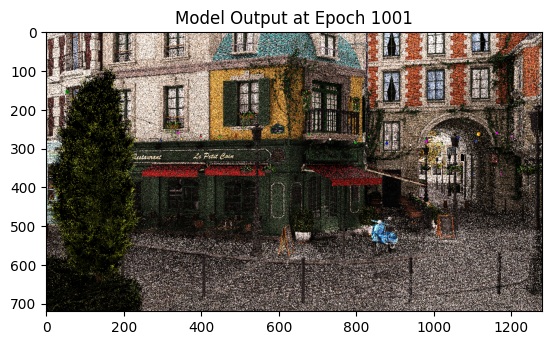

Epoch [1005/1000], AveragedLoss: 4.674241881772131, Loss: 7.8718791007995605, rL2_loss: 5.001863121986389
Epoch [1010/1000], AveragedLoss: 4.61958676519366, Loss: 2.29355788230896, rL2_loss: 4.724739181995392
Epoch [1015/1000], AveragedLoss: 5.478302129093649, Loss: 15.333803176879883, rL2_loss: 5.889473716417948
Epoch [1020/1000], AveragedLoss: 5.052624931234898, Loss: 5.141603946685791, rL2_loss: 5.305990213155746
Epoch [1025/1000], AveragedLoss: 4.7796588060939875, Loss: 3.3005402088165283, rL2_loss: 5.02301161289215
Epoch [1030/1000], AveragedLoss: 4.485174557269968, Loss: 5.408725261688232, rL2_loss: 4.757575523853302
Epoch [1035/1000], AveragedLoss: 4.18714176099472, Loss: 4.846441268920898, rL2_loss: 4.522746205329895
Epoch [1040/1000], AveragedLoss: 4.356920516144504, Loss: 8.554842948913574, rL2_loss: 4.558443871140479
Epoch [1045/1000], AveragedLoss: 4.157319001209734, Loss: 3.2708709239959717, rL2_loss: 4.438898401790194
Epoch [1050/1000], AveragedLoss: 10.080130561575572, L

In [55]:
import torch.nn as nn

class PixelLatentLayer(nn.Module):
    def __init__(self, width, height, params_per_pixel, device, init_method='xavier'):
        super(PixelLatentLayer, self).__init__()
        self.width = width
        self.height = height
        self.params_per_pixel = params_per_pixel
        self.latents_per_pixel = nn.Parameter(torch.empty(width, height, params_per_pixel, device=device))

        if init_method == 'xavier':
            bound = math.sqrt(2 / (64 + params_per_pixel))
        elif init_method == 'he':
            bound = math.sqrt(2 / (64))
        elif init_method == 'uniform_large':
            bound = 1e-4
        else:
            bound = 1e-4  # default

        nn.init.uniform_(self.latents_per_pixel, -bound, bound)

    def forward(self, pixel_indices):
        latents = self.latents_per_pixel[pixel_indices[:, 0], pixel_indices[:, 1]]
        return latents 

# Define the SH Layer
class SHLayer(nn.Module):
    def __init__(self, num_bands=5):
        super(SHLayer, self).__init__()
        self.num_bands = num_bands

    def forward(self, dirs):
        x, y, z = dirs[:, 0], dirs[:, 1], dirs[:, 2]

        # Compute necessary products and powers
        xy = x * y
        xz = x * z
        yz = y * z
        x2 = x * x
        y2 = y * y
        z2 = z * z
        x4 = x2 * x2
        y4 = y2 * y2
        z4 = z2 * z2

        # Initialize the tensor to store the SH features
        batch_size = dirs.size(0)
        num_features = 25  # Assuming 5 bands
        sh_features = torch.zeros(batch_size, num_features, device=dirs.device)

        # Band 0
        sh_features[:, 0] = 0.28209479177387814

        # Band 1
        if self.num_bands > 1:
            sh_features[:, 1] = -0.48860251190291987 * y
            sh_features[:, 2] = 0.48860251190291987 * z
            sh_features[:, 3] = -0.48860251190291987 * x

        # Band 2
        if self.num_bands > 2:
            sh_features[:, 4] = 1.0925484305920792 * xy
            sh_features[:, 5] = -1.0925484305920792 * yz
            sh_features[:, 6] = 0.94617469575755997 * z2 - 0.31539156525251999
            sh_features[:, 7] = -1.0925484305920792 * xz
            sh_features[:, 8] = 0.54627421529603959 * (x2 - y2)

        # Band 3
        if self.num_bands > 3:
            sh_features[:, 9] = 0.59004358992664352 * y * (-3 * x2 + y2)
            sh_features[:, 10] = 2.8906114426405538 * xy * z
            sh_features[:, 11] = 0.45704579946446572 * y * (1 - 5 * z2)
            sh_features[:, 12] = 0.3731763325901154 * z * (5 * z2 - 3)
            sh_features[:, 13] = 0.45704579946446572 * x * (1 - 5 * z2)
            sh_features[:, 14] = 1.4453057213202769 * z * (x2 - y2)
            sh_features[:, 15] = 0.59004358992664352 * x * (-x2 + 3 * y2)

        # Band 4
        if self.num_bands > 4:
            sh_features[:, 16] = 2.5033429417967046 * xy * (x2 - y2)
            sh_features[:, 17] = 1.7701307697799304 * yz * (-3 * x2 + y2)
            sh_features[:, 18] = 0.94617469575756008 * xy * (7 * z2 - 1)
            sh_features[:, 19] = 0.66904654355728921 * yz * (3 - 7 * z2)
            sh_features[:, 20] = -3.1735664074561294 * z2 + 3.7024941420321507 * z4 + 0.31735664074561293
            sh_features[:, 21] = 0.66904654355728921 * xz * (3 - 7 * z2)
            sh_features[:, 22] = 0.47308734787878004 * (x2 - y2) * (7 * z2 - 1)
            sh_features[:, 23] = 1.7701307697799304 * xz * (-x2 + 3 * y2)
            sh_features[:, 24] = -3.7550144126950569 * x2 * y2 + 0.62583573544917614 * x4 + 0.62583573544917614 * y4

        return sh_features

# Define the combined model
class CombinedModel(nn.Module):
    def __init__(self, width, height, params_per_pixel, num_bands, device):
        super(CombinedModel, self).__init__()
        self.pixel_latent_layer = PixelLatentLayer(width, height, params_per_pixel, device)
        self.sh_layer = SHLayer(num_bands).to(device)
        input_dim = params_per_pixel + 25  # PixelLatentLayer produces params_per_pixel features, SHLayer produces 25 features
        self.mlp = MLP(input_dim, 3).to(device)

    def forward(self, directions, pixel_indices):
        sh_features = self.sh_layer(directions)
        latent_features = self.pixel_latent_layer(pixel_indices)
        combined_features = torch.cat((latent_features, sh_features), dim=1)
        output = self.mlp(combined_features)
        return output


class NIRC_EQMem_Model(torch.nn.Module):
    def __init__(self, width, height, config_path, device, params_per_pixel=2, init_method='xavier'):
        super(NIRC_EQMem_Model, self).__init__()
        self.model = CombinedModel(width, height,params_per_pixel, 5, device)
        self.optimizer = torch.optim.Adam(self.parameters(), lr=0.001, betas=[0.9, 0.99])
        self.scheduler = torch.optim.lr_scheduler.StepLR(self.optimizer, step_size=300, gamma=0.25)
        self.params_per_pixel = 0
        self.checkpoint_path = None
        self.device = device
        self.rL2 = 0


    def set_checkpoint_path(self, checkpoint_dir):
        os.makedirs(checkpoint_dir, exist_ok=True)
        self.checkpoint_path = os.path.join(checkpoint_dir, f'nirc_eqmem_{self.params_per_pixel}_checkpoint.pth')

    def save_checkpoint(self, epoch, loss):
        if self.checkpoint_path:
            torch.save({
                'epoch': epoch,
                'model_state_dict': self.model.state_dict(),
                'optimizer_state_dict': self.optimizer.state_dict(),
                'loss': loss,
                'rL2': self.rL2,
            }, self.checkpoint_path)

    def load_checkpoint(self, skip=False):
        if not skip and self.checkpoint_path and os.path.exists(self.checkpoint_path):
            checkpoint = torch.load(self.checkpoint_path)
            self.model.load_state_dict(checkpoint['model_state_dict'])
            self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
            epoch = checkpoint['epoch']
            loss = checkpoint['loss']
            self.rL2 = checkpoint['rL2']
            
            print(f"Checkpoint loaded: Epoch {epoch}, Loss {self.rL2 }")
            return epoch, loss
        else:
            return 0, None

    def forward(self, x, pixel_indices, thp):
        return torch.relu(self.model(x, pixel_indices))*thp

    def prepare_input(self, mlDataOutput, pixel_indices, mask=None):
        ddir = mlDataOutput["dir"]+0
        norm = (torch.sqrt(torch.sum(ddir**2, dim=1))).unsqueeze(1)
        ddir = ddir / norm
        if mask is not None:
            X = X[mask]
            pixel_indices = pixel_indices[mask]

        return ddir, pixel_indices


# Assuming scene_cfg, gparams, ml_data, and other necessary variables are properly defined
scene_cfg.prepare_scene(ref_scene)

# Initialize NIRC_Model
nirc_eqmem_model = NIRC_EQMem_Model(init_method='xavier', config_path="data/nirc_equal_mem_dummy.json", width=gparams.render_width, height=gparams.render_height, params_per_pixel=75, device=device_t)
nirc_eqmem_model.set_checkpoint_path(scene_cfg.checkpoint_dir)

# Load checkpoint if it exists
start_epoch, _ = nirc_eqmem_model.load_checkpoint(skip=False)

# Training parameters
N = 1000  # number of epochs
B = 1  # batch size
simulate_tiles = False  # like in the original NRC work
tile_width, tile_height = 1, 1  # Sampling one point per 2x2 tile
eps = 0.005
lambda_l2 = 0.00000001  # Weight for L2 regularization
L2Reg = False

# Enter training mode
nirc_eqmem_model.train()

if start_epoch > N:
    start_epoch = N
    nirc_eqmem_model.rL2 = 0

re_accum = 1
for epoch in range(start_epoch, N + gparams.OnlyLossEpoch):
    start_render = time.time()
    # Render a new frame each epoch
    trainFrame()
    # Get the newly rendered data
    mlDataOutput = falcor_to_torch_split_interleaved(ml_data, field_types)
    render_time = time.time() - start_render


    # Generate pixel indices
    arr = torch.arange(mlDataOutput["dir"].shape[0])
    pixel_indices = torch.stack((arr % gparams.render_width, arr // gparams.render_width), dim=1).to(device_t)

    # Prepare inputs
    y = mlDataOutput["radiance"]+0.0  # Clone to manage memory
    thp = mlDataOutput["thp"]+0.0
    pdf = safe_pdf(mlDataOutput["pdf"]+0.0)
    # y = y*thp
    X, pixel_indices = nirc_eqmem_model.prepare_input(mlDataOutput, pixel_indices)

    width, height = gparams.render_width, gparams.render_height
    total_samples = X.size()[0]
    samples_per_batch = total_samples // B

        
    loss_epoch = epoch-N
    bTrainNow = loss_epoch < 0
    for batch_index in range(B):
        if bTrainNow:
            nirc_eqmem_model.optimizer.zero_grad()

        # Apply tiling to the current batch
        batch_indices = vectorized_uniform_stratified_sampling(width, height, tile_width, tile_height)
        batch_indices = batch_indices[:samples_per_batch]  # Ensure the batch size matches

        batch_thp = thp[batch_indices]


        batch_x = X[batch_indices]
        batch_y = y[batch_indices]
        batch_pdf = pdf[batch_indices]
        batch_pixel_indices = pixel_indices[batch_indices]

        mask = get_mask_for_training(batch_y, False)
        batch_y = batch_y[mask]
        batch_x = batch_x[mask]
        batch_pdf = batch_pdf[mask]
        batch_thp = batch_thp[mask]
        batch_pixel_indices = batch_pixel_indices[mask]

        # Forward pass
        outputs = nirc_eqmem_model(batch_x, batch_pixel_indices, batch_thp)#*batch_thp
        
        if bTrainNow:
            outputs.detach()

        # Compute Loss
        
        
        if not bTrainNow:
            outputs = outputs.detach()
            loss_val = 0

        loss = relativeL2(outputs, batch_y, pdf=batch_pdf, div=ref_estimations[batch_indices][mask])
        total_loss = loss 

        loss_val = loss.item()
        rL2 = loss.item()
        if bTrainNow:
            if epoch == 0 and batch_index == 0:
                nirc_eqmem_model.rL2 = rL2
            nirc_eqmem_model.rL2 = rL2*0.90+nirc_eqmem_model.rL2*0.10
        else:
            overe = 1.0 / re_accum
            nirc_eqmem_model.rL2 = rL2* overe + (1-overe) * nirc_eqmem_model.rL2
            re_accum += 1

        # Backward and optimize
        if bTrainNow:
            total_loss.backward()
            torch.nn.utils.clip_grad_norm_(nirc_eqmem_model.model.parameters(), 3000)  # Clipping gradients to avoid explosion
            nirc_eqmem_model.optimizer.step()
    nirc_eqmem_model.scheduler.step()
    # Reporting
    if epoch == start_epoch:
        average_loss = loss_val
    else:
        alpha = 0.95
        average_loss = average_loss * alpha + (1.0 - alpha) * loss_val

    if (epoch + 1) % 5 == 0:
        print(f'Epoch [{epoch + 1}/{N}], AveragedLoss: {average_loss}, Loss: {loss_val}, rL2_loss: {nirc_eqmem_model.rL2}')

    if (loss_val == 0 or math.isinf(loss_val) or math.isnan(loss_val)) and bTrainNow:
        start_epoch, _ = nirc_eqmem_model.load_checkpoint(skip=False)
        epoch = start_epoch
        print("RESTART!")
        continue
    
    
        # Define the conditions and intervals as tuples (max_epoch, interval)
    conditions = [
        (10, 10),
        (25, 20),
        (500, 40),
    ]
    # Example usage in training loop
    if (should_visualize(epoch, conditions) and bTrainNow) or loss_epoch == 0:
        #nirc_eqmem_model.eval()
        visualize_model_output((nirc_eqmem_model(X, pixel_indices, thp).detach()).cpu(), gparams.render_width, gparams.render_height, epoch)
        #nirc_eqmem_model.train()

    if (epoch + 1) % 100 == 0:
        nirc_eqmem_model.save_checkpoint(epoch, average_loss)


## SH

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


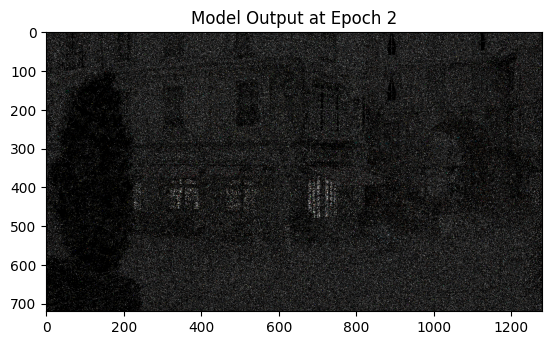

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


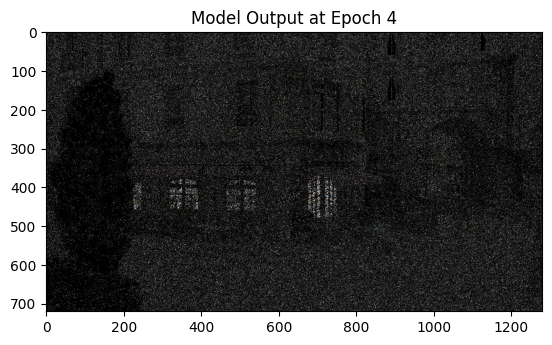

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [5/750],  AverageLoss: 435.96691202373495, Loss: 95.80734252929688, rL2_loss: 103.92047569580077 Num Used Elements 921553/921600


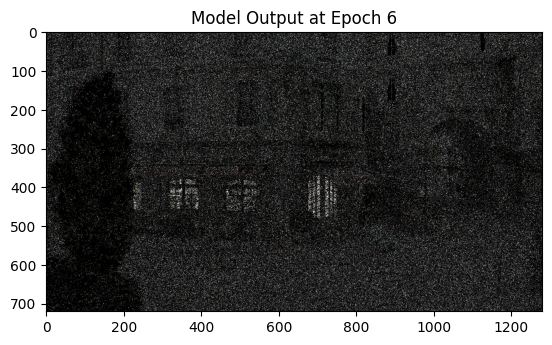

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


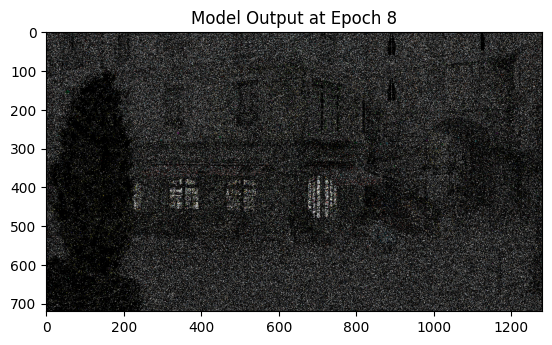

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [10/750],  AverageLoss: 427.99857075198423, Loss: 124.7815170288086, rL2_loss: 121.38575450566029 Num Used Elements 921553/921600


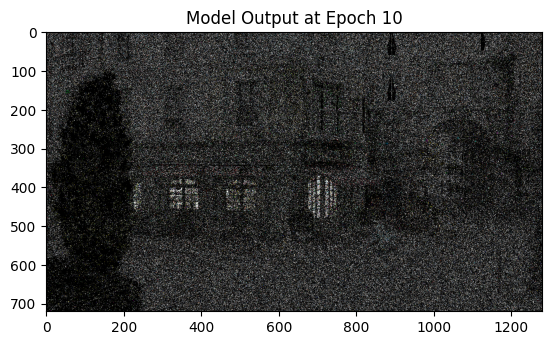

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [15/750],  AverageLoss: 350.66842425538204, Loss: 69.42233276367188, rL2_loss: 71.45453504963795 Num Used Elements 921553/921600


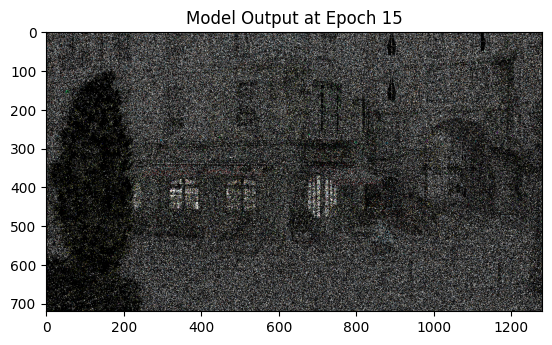

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [20/750],  AverageLoss: 290.2421981642944, Loss: 79.60635375976562, rL2_loss: 86.80043532835526 Num Used Elements 921553/921600


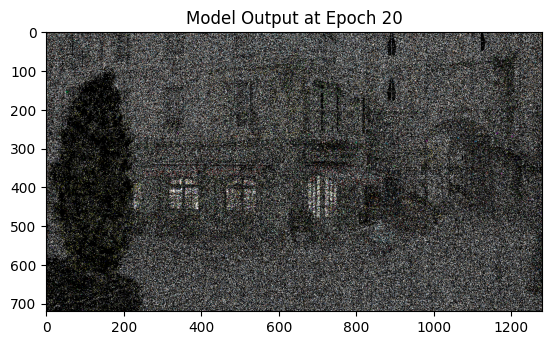

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [25/750],  AverageLoss: 238.08795428921553, Loss: 86.46481323242188, rL2_loss: 81.71869042416834 Num Used Elements 921553/921600


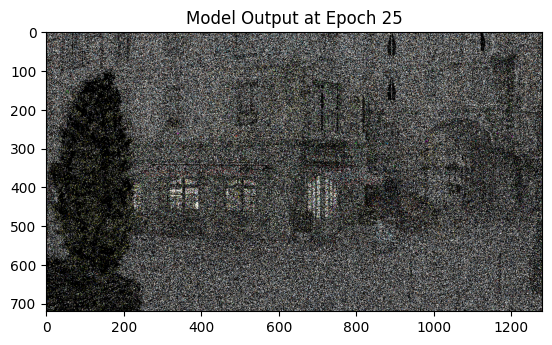

Epoch [30/750],  AverageLoss: 200.0223212276433, Loss: 53.3526725769043, rL2_loss: 58.52667300134211 Num Used Elements 921553/921600
Epoch [35/750],  AverageLoss: 166.56888751394501, Loss: 46.27941131591797, rL2_loss: 46.017239123579685 Num Used Elements 921553/921600
Epoch [40/750],  AverageLoss: 138.12271799614248, Loss: 27.774465560913086, rL2_loss: 28.679001261945068 Num Used Elements 921553/921600
Epoch [45/750],  AverageLoss: 118.39276984770017, Loss: 35.641082763671875, rL2_loss: 38.05057681850841 Num Used Elements 921553/921600


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [50/750],  AverageLoss: 99.52769441206989, Loss: 20.32878875732422, rL2_loss: 21.10867666135443 Num Used Elements 921553/921600


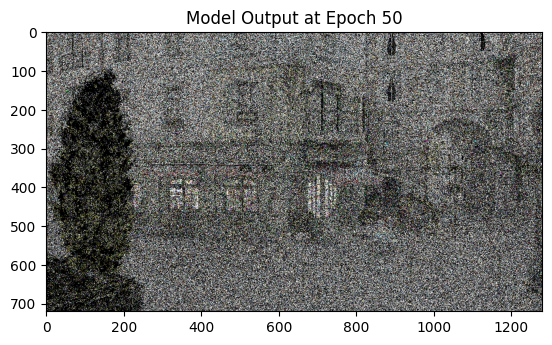

Epoch [55/750],  AverageLoss: 87.3117701419581, Loss: 39.27898025512695, rL2_loss: 44.554968949792276 Num Used Elements 921553/921600
Epoch [60/750],  AverageLoss: 79.06835906239326, Loss: 101.09486389160156, rL2_loss: 94.7572722290146 Num Used Elements 921553/921600
Epoch [65/750],  AverageLoss: 76.51746968697867, Loss: 63.91802215576172, rL2_loss: 60.7928628699635 Num Used Elements 921553/921600
Epoch [70/750],  AverageLoss: 68.30343721194883, Loss: 18.473115921020508, rL2_loss: 19.918149028291484 Num Used Elements 921553/921600
Epoch [75/750],  AverageLoss: 59.282256759166415, Loss: 19.539602279663086, rL2_loss: 21.652500759191852 Num Used Elements 921553/921600
Epoch [80/750],  AverageLoss: 54.87415169948813, Loss: 31.37276840209961, rL2_loss: 31.103487003294337 Num Used Elements 921553/921600
Epoch [85/750],  AverageLoss: 51.32931474201749, Loss: 75.36869049072266, rL2_loss: 72.19355951353062 Num Used Elements 921553/921600
Epoch [90/750],  AverageLoss: 49.40231928648295, Loss: 61

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


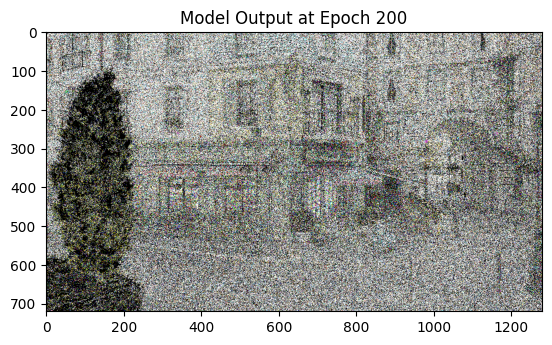

Epoch [205/750],  AverageLoss: 23.90561162642575, Loss: 14.032327651977539, rL2_loss: 14.113942386954445 Num Used Elements 921553/921600
Epoch [210/750],  AverageLoss: 25.153013779382587, Loss: 8.820677757263184, rL2_loss: 9.50569224330189 Num Used Elements 921553/921600
Epoch [215/750],  AverageLoss: 24.12413717993208, Loss: 43.229736328125, rL2_loss: 40.304114354846476 Num Used Elements 921553/921600
Epoch [220/750],  AverageLoss: 26.59296613837231, Loss: 105.43972778320312, rL2_loss: 96.0966961652757 Num Used Elements 921553/921600
Epoch [225/750],  AverageLoss: 24.336121969202328, Loss: 8.952317237854004, rL2_loss: 9.521523830960065 Num Used Elements 921553/921600
Epoch [230/750],  AverageLoss: 24.187220708986775, Loss: 56.911170959472656, rL2_loss: 52.20139051817296 Num Used Elements 921553/921600
Epoch [235/750],  AverageLoss: 25.785517019379096, Loss: 16.415382385253906, rL2_loss: 18.58366825084938 Num Used Elements 921553/921600
Epoch [240/750],  AverageLoss: 22.847846154180925

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


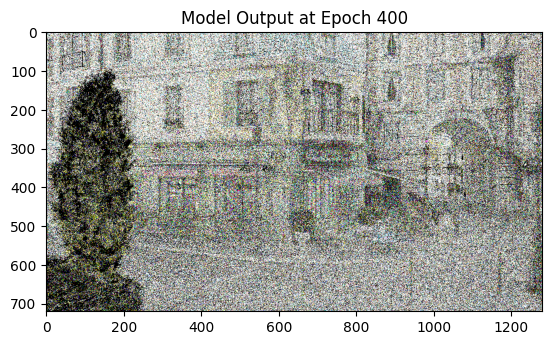

Epoch [405/750],  AverageLoss: 14.976974867335283, Loss: 5.669795989990234, rL2_loss: 6.090839958915996 Num Used Elements 921553/921600
Epoch [410/750],  AverageLoss: 16.674820664865695, Loss: 15.51257038116455, rL2_loss: 15.954109670043952 Num Used Elements 921553/921600
Epoch [415/750],  AverageLoss: 14.666263501648169, Loss: 6.5730390548706055, rL2_loss: 6.812567024645819 Num Used Elements 921553/921600
Epoch [420/750],  AverageLoss: 13.490646348131689, Loss: 11.18268871307373, rL2_loss: 10.968355165493778 Num Used Elements 921553/921600
Epoch [425/750],  AverageLoss: 13.87571168741749, Loss: 16.642019271850586, rL2_loss: 16.06333071567522 Num Used Elements 921553/921600
Epoch [430/750],  AverageLoss: 12.340079025929716, Loss: 4.970258712768555, rL2_loss: 5.359996873956381 Num Used Elements 921553/921600
Epoch [435/750],  AverageLoss: 11.689639699132835, Loss: 10.87242603302002, rL2_loss: 10.718052293577978 Num Used Elements 921553/921600
Epoch [440/750],  AverageLoss: 10.7810991149

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


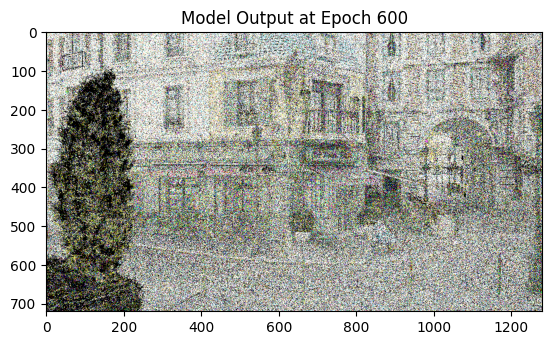

Epoch [605/750],  AverageLoss: 12.19341399353721, Loss: 7.309234142303467, rL2_loss: 7.281817411450616 Num Used Elements 921553/921600
Epoch [610/750],  AverageLoss: 12.41059694826829, Loss: 4.913231372833252, rL2_loss: 5.627944630527249 Num Used Elements 921553/921600
Epoch [615/750],  AverageLoss: 12.50214720403815, Loss: 21.991315841674805, rL2_loss: 20.299572357594197 Num Used Elements 921553/921600
Epoch [620/750],  AverageLoss: 10.965883694436851, Loss: 4.919152736663818, rL2_loss: 4.883631569188924 Num Used Elements 921553/921600
Epoch [625/750],  AverageLoss: 12.825459792176483, Loss: 4.955782413482666, rL2_loss: 5.507858887637675 Num Used Elements 921553/921600
Epoch [630/750],  AverageLoss: 11.706021800676586, Loss: 17.2255916595459, rL2_loss: 16.059375421134387 Num Used Elements 921553/921600
Epoch [635/750],  AverageLoss: 14.925997015684155, Loss: 5.6550469398498535, rL2_loss: 6.612790229088227 Num Used Elements 921553/921600
Epoch [640/750],  AverageLoss: 13.75703329157032

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [750/750],  AverageLoss: 9.825758050707613, Loss: 6.187845706939697, rL2_loss: 7.978669751687331 Num Used Elements 921553/921600


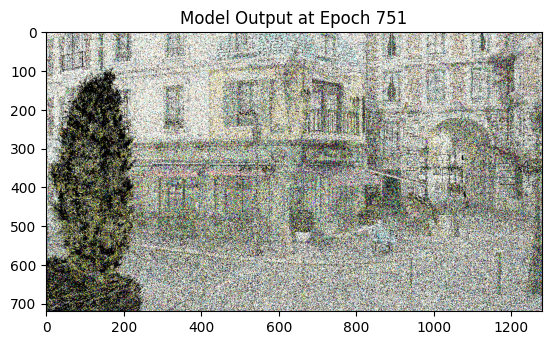

Epoch [755/750],  AverageLoss: 9.172333138764523, Loss: 5.243228912353516, rL2_loss: 7.01315450668335 Num Used Elements 921553/921600
Epoch [760/750],  AverageLoss: 11.107081411604376, Loss: 6.448605537414551, rL2_loss: 12.68538179397583 Num Used Elements 921553/921600
Epoch [765/750],  AverageLoss: 10.444235072985558, Loss: 5.475600719451904, rL2_loss: 11.2038117090861 Num Used Elements 921553/921600
Epoch [770/750],  AverageLoss: 10.055086127144762, Loss: 9.46536922454834, rL2_loss: 10.569770693778992 Num Used Elements 921553/921600
Epoch [775/750],  AverageLoss: 11.67992342581716, Loss: 8.805219650268555, rL2_loss: 11.897547435760497 Num Used Elements 921553/921600
Epoch [780/750],  AverageLoss: 11.591595699127398, Loss: 15.282541275024414, rL2_loss: 11.785638713836672 Num Used Elements 921553/921600
Epoch [785/750],  AverageLoss: 11.123984294892626, Loss: 12.851635932922363, rL2_loss: 11.45842001778739 Num Used Elements 921553/921600
Epoch [790/750],  AverageLoss: 11.15568945949999

In [52]:
class SHModel(torch.nn.Module):
    def __init__(self, num_bands, width, height):
        super(SHModel, self).__init__()
        self.num_bands = num_bands
        self.num_coeffs = self.num_bands**2  # Total number of SH coefficients for n bands
        self.sh_coefficients = torch.nn.Parameter(torch.zeros(3, width * height, self.num_coeffs))  # 3 sets of coefficients for RGB channels
        self.rL2 = 0

    def forward(self, dirs, debugID=None, mask=None):
        batch_size = dirs.size(0)
        radiance = torch.zeros(batch_size, 3, device=dirs.device)

        for i in range(3):  # Process each color channel
            if debugID is not None:
                # Use only the coefficients corresponding to the debugID
                coefficients = self.sh_coefficients[i, debugID, :].unsqueeze(0).repeat(batch_size, 1)
            else:
                coefficients = self.sh_coefficients[i]

            if mask is not None:
                coefficients = coefficients[mask]
            radiance[:, i] = self.eval_sh(dirs, coefficients)

        return radiance

    def set_checkpoint_path(self, checkpoint_dir):
        os.makedirs(checkpoint_dir, exist_ok=True)
        self.checkpoint_path = os.path.join(checkpoint_dir, f'sh_{self.num_coeffs * 3}_checkpoint.pth')

    def save_checkpoint(self, epoch, loss):
        if self.checkpoint_path:
            torch.save({
                'epoch': epoch,
                'num_bands': self.num_bands,
                'sh_coefficients': self.state_dict(),
                'loss': loss,
                'rL2': self.rL2,
            }, self.checkpoint_path)

    def load_checkpoint(self, skip=False):
        if not skip and self.checkpoint_path and os.path.exists(self.checkpoint_path):
            checkpoint = torch.load(self.checkpoint_path)

            self.num_bands = checkpoint['num_bands']
            self.num_coeffs = self.num_bands**2
            self.load_state_dict(checkpoint['sh_coefficients'])
            epoch = checkpoint['epoch']
            loss = checkpoint['loss']
            self.rL2 = checkpoint['rL2']

            print(f"Checkpoint loaded: Epoch {epoch}, Loss {self.rL2}")
            return epoch, loss
        else:
            return 0, None

    def eval_sh(self, dirs, coefficients):
        # Compute SH basis functions up to the given degree
        x, y, z = dirs[:, 0], dirs[:, 1], dirs[:, 2]
        batch_size = dirs.size(0)
        data_out = torch.zeros(batch_size, device=dirs.device)

        # Compute necessary products and powers
        xy = x * y
        xz = x * z
        yz = y * z
        x2 = x * x
        y2 = y * y
        z2 = z * z

        # Include terms for each band, similar to the provided eval_sh function
        # Band 0
        xy = x * y
        xz = x * z
        yz = y * z
        x2 = x * x
        y2 = y * y
        z2 = z * z
        x4 = x2 * x2
        y4 = y2 * y2
        z4 = z2 * z2

        # First band: 0
        data_out += 0.28209479177387814 * coefficients[:, 0]

        # Second band: 1
        if self.num_bands > 1:
            data_out += -0.48860251190291987 * y * coefficients[:, 1]
            data_out += 0.48860251190291987 * z * coefficients[:, 2]
            data_out += -0.48860251190291987 * x * coefficients[:, 3]

        # Third band: 2
        if self.num_bands > 2:
            data_out += 1.0925484305920792 * xy * coefficients[:, 4]
            data_out += -1.0925484305920792 * yz * coefficients[:, 5]
            data_out += (0.94617469575755997 * z2 - 0.31539156525251999) * coefficients[:, 6]
            data_out += -1.0925484305920792 * xz * coefficients[:, 7]
            data_out += (0.54627421529603959 * (x2 - y2)) * coefficients[:, 8]

        # Fourth band: 3
        if self.num_bands > 3:
            data_out += 0.59004358992664352 * y * (-3 * x2 + y2) * coefficients[:, 9]
            data_out += 2.8906114426405538 * xy * z * coefficients[:, 10]
            data_out += 0.45704579946446572 * y * (1 - 5 * z2) * coefficients[:, 11]
            data_out += 0.3731763325901154 * z * (5 * z2 - 3) * coefficients[:, 12]
            data_out += 0.45704579946446572 * x * (1 - 5 * z2) * coefficients[:, 13]
            data_out += 1.4453057213202769 * z * (x2 - y2) * coefficients[:, 14]
            data_out += 0.59004358992664352 * x * (-x2 + 3 * y2) * coefficients[:, 15]

        # Fifth band: 4
        if self.num_bands > 4:
            data_out += 2.5033429417967046 * xy * (x2 - y2) * coefficients[:, 16]
            data_out += 1.7701307697799304 * yz * (-3 * x2 + y2) * coefficients[:, 17]
            data_out += 0.94617469575756008 * xy * (7 * z2 - 1) * coefficients[:, 18]
            data_out += 0.66904654355728921 * yz * (3 - 7 * z2) * coefficients[:, 19]
            data_out += (-3.1735664074561294 * z2 + 3.7024941420321507 * z4 + 0.31735664074561293) * coefficients[:, 20]
            data_out += 0.66904654355728921 * xz * (3 - 7 * z2) * coefficients[:, 21]
            data_out += 0.47308734787878004 * (x2 - y2) * (7 * z2 - 1) * coefficients[:, 22]
            data_out += 1.7701307697799304 * xz * (-x2 + 3 * y2) * coefficients[:, 23]
            data_out += (-3.7550144126950569 * x2 * y2 + 0.62583573544917614 * x4 + 0.62583573544917614 * y4) * coefficients[:, 24]

        return data_out
    

import time

scene_cfg.prepare_scene(ref_scene)

# how many bands?
sh_model = SHModel(num_bands=5, width=gparams.render_width, height=gparams.render_height).to(device_t)
optimizer = torch.optim.Adam(sh_model.parameters(), lr=gparams.ADAM_LR, betas=gparams.ADAM_BETAS)

sh_model.set_checkpoint_path(scene_cfg.checkpoint_dir)

# Load checkpoint if it exists
start_epoch, _ = sh_model.load_checkpoint(skip=True)

relative_error = False
N = gparams.num_training_frames*5  # number of epochs

# we use gradient backprogatation rather than just plain SH projection because it converges faster (the power of Adam)

if start_epoch > N:
    start_epoch = N
    sh_model.rL2 = 0

re_accum = 1
for epoch in range(start_epoch, N + gparams.OnlyLossEpoch):
    loss_epoch = epoch-N
    bTrainNow = loss_epoch < 0
    if not bTrainNow:
        sh_model.eval()
    else:
        optimizer.zero_grad()
            
    start_render = time.time()
    # Render a new frame each epoch
    trainFrame()


    # Get the newly rendered data
    mlDataOutput = falcor_to_torch_split_interleaved(ml_data, field_types)

    y = mlDataOutput["radiance"]+0.0
    thp = mlDataOutput["thp"]+0.0
    pdf = safe_pdf(mlDataOutput["pdf"]+0.0)

    pdf_original = pdf
    dirs = mlDataOutput["dir"]+0.0
    dirs_original = dirs

    # y = y*thp

    mask = get_mask_for_training(y)
    mask = mask & get_mask_for_training(pdf)
    # Filter out NaNs from 'y' and corresponding elements in 'X'

    num_elements = pdf.shape[0]
    y = y[mask]
    dirs = dirs[mask]
    pdf = pdf[mask]

    num_used_elements = pdf.shape[0]

    # Prepare the data

    # Forward pass
    
    outputs = sh_model(dirs, mask=mask)

    if not bTrainNow:
        outputs = outputs.detach()
    
    rL2 = relativeL2(outputs/pdf, y, pdf=pdf, div=ref_estimations[mask])
    loss = rL2
    loss_val = loss.item()
    rL2 = rL2.item()
    if bTrainNow:
        if epoch == 0:
            sh_model.rL2 = rL2
        sh_model.rL2 = rL2*0.90+sh_model.rL2*0.10
    else:
        overe = 1.0 / re_accum
        sh_model.rL2 = rL2* overe + (1-overe) * sh_model.rL2
        re_accum += 1
    
    # Backward and optimize
    start_backprop = time.time()
    
    
    # Backward and optimize
    if bTrainNow:
        loss.backward()
        torch.nn.utils.clip_grad_norm_(sh_model.parameters(), 10000)
        optimizer.step()


    if epoch == 0:
        average_loss = loss_val
    else:
        alpha = 0.95
        average_loss = average_loss*alpha+(1.0-alpha)*loss_val
         
         
    if (epoch+1) % 5 == 0:
        print(f'Epoch [{epoch+1}/{N}],  AverageLoss: {average_loss}, Loss: {loss_val}, rL2_loss: {sh_model.rL2} Num Used Elements {num_used_elements}/{num_elements}')
    
    if (epoch + 1) % 100 == 0:
        sh_model.save_checkpoint(epoch, average_loss)

    conditions = [
        (10, 2),
        (25, 5),
        (50, 50),
    ]

    if (should_visualize(epoch, conditions) and bTrainNow) or epoch == N:
        sh_model.eval()
        visualize_model_output((sh_model(dirs_original)/pdf_original).cpu(), gparams.render_width, gparams.render_height, epoch)
        sh_model.train()

## VMF

torch.Size([921600, 11, 3])
Kappa is init with value: 5.871550559997559 for the 11 vMF lobes
Epoch [10/1100],  Log_Likehood: -4.298721790313721 L2: None rL2: 0 used: 921553/921600
Epoch [20/1100],  Log_Likehood: -4.275775909423828 L2: None rL2: 0 used: 921553/921600


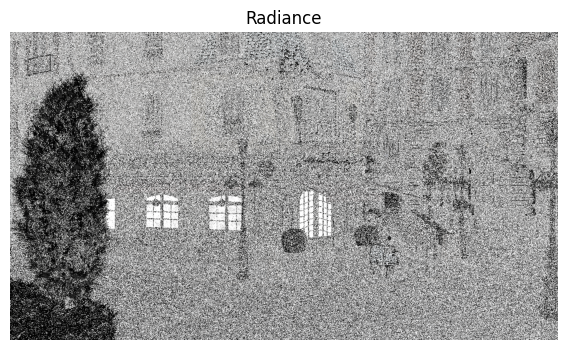

Epoch [30/1100],  Log_Likehood: -4.269983291625977 L2: 63.96104049682617 rL2: 61.24787521362305 used: 921553/921600


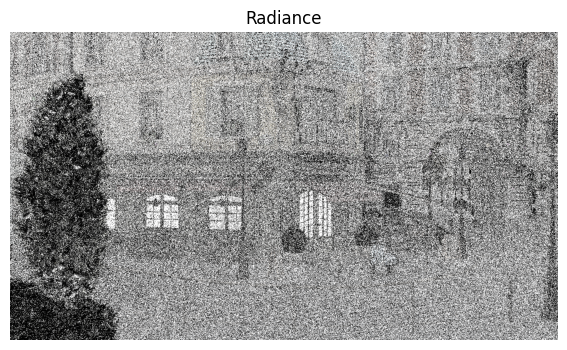

Epoch [40/1100],  Log_Likehood: -4.946075916290283 L2: 43.500267028808594 rL2: 43.50202941894531 used: 921553/921600


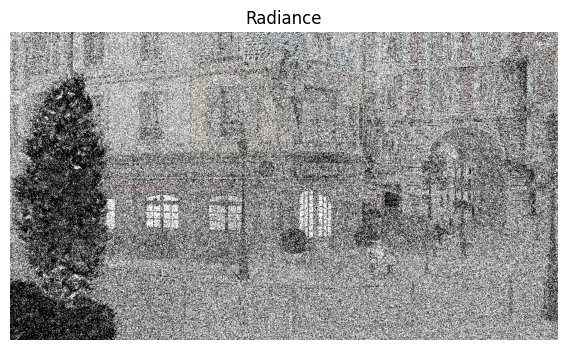

Epoch [50/1100],  Log_Likehood: -5.1593546867370605 L2: 48.58354187011719 rL2: 48.95681381225586 used: 921553/921600


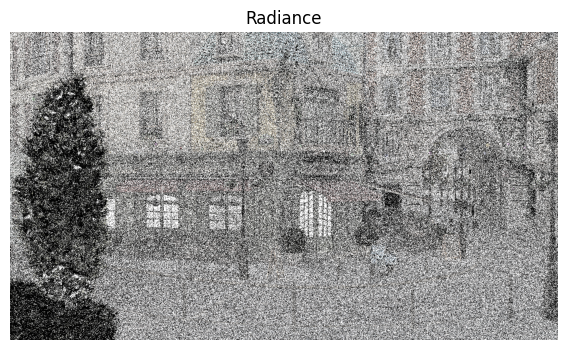

Epoch [60/1100],  Log_Likehood: -5.333629608154297 L2: 42.88533401489258 rL2: 43.1898078918457 used: 921553/921600


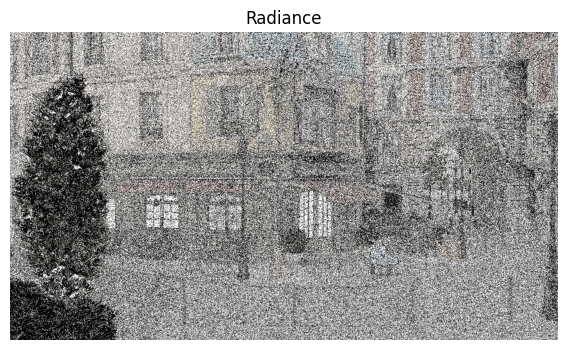

Epoch [70/1100],  Log_Likehood: -5.426575183868408 L2: 91.65078735351562 rL2: 87.50952911376953 used: 921553/921600


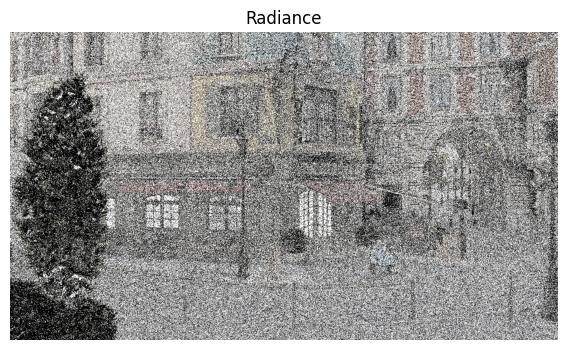

Epoch [80/1100],  Log_Likehood: -5.489386081695557 L2: 53.189483642578125 rL2: 51.79185104370117 used: 921553/921600


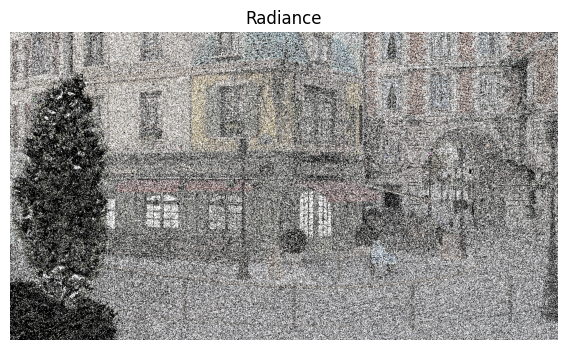

Epoch [90/1100],  Log_Likehood: -5.553308486938477 L2: 57.49892044067383 rL2: 56.72043228149414 used: 921553/921600


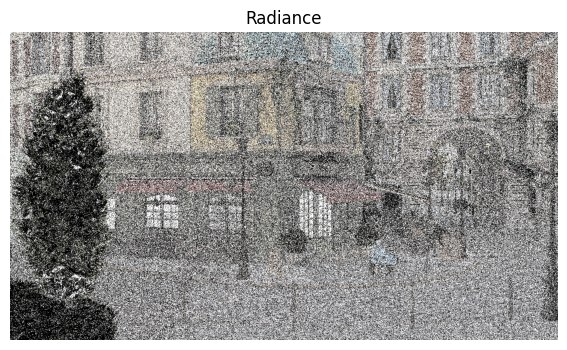

Epoch [100/1100],  Log_Likehood: -5.586362838745117 L2: 38.79450607299805 rL2: 39.62661361694336 used: 921553/921600
Epoch [110/1100],  Log_Likehood: -5.650234222412109 L2: 42.14507293701172 rL2: 42.33467483520508 used: 921553/921600
Epoch [120/1100],  Log_Likehood: -5.640926837921143 L2: 37.759098052978516 rL2: 43.602073669433594 used: 921553/921600
Epoch [130/1100],  Log_Likehood: -5.677553653717041 L2: 36.23222351074219 rL2: 37.113922119140625 used: 921553/921600
Epoch [140/1100],  Log_Likehood: -5.694697380065918 L2: 36.480438232421875 rL2: 37.09682083129883 used: 921553/921600
Epoch [150/1100],  Log_Likehood: -5.773890018463135 L2: 153.55775451660156 rL2: 143.06150817871094 used: 921553/921600
Epoch [160/1100],  Log_Likehood: -5.828128337860107 L2: 57.00379180908203 rL2: 54.47808074951172 used: 921553/921600
Epoch [170/1100],  Log_Likehood: -5.775941371917725 L2: 33.44418716430664 rL2: 33.35148620605469 used: 921553/921600
Epoch [180/1100],  Log_Likehood: -5.857410430908203 L2: 39

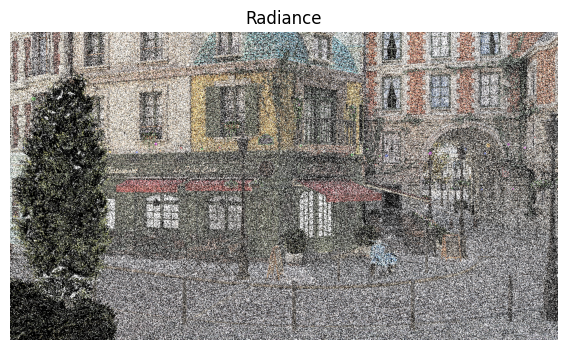

Epoch [200/1100],  Log_Likehood: -5.759061336517334 L2: 29.3957462310791 rL2: 29.998125076293945 used: 921553/921600
Epoch [210/1100],  Log_Likehood: -5.911942958831787 L2: 36.0584602355957 rL2: 36.88394546508789 used: 921553/921600
Epoch [220/1100],  Log_Likehood: -5.886526584625244 L2: 48.27836608886719 rL2: 47.15215301513672 used: 921553/921600
Epoch [230/1100],  Log_Likehood: -5.949084758758545 L2: 42.14696502685547 rL2: 41.4182014465332 used: 921553/921600
Epoch [240/1100],  Log_Likehood: -6.005934238433838 L2: 48.807151794433594 rL2: 47.05025100708008 used: 921553/921600
Epoch [250/1100],  Log_Likehood: -5.948107719421387 L2: 32.43734359741211 rL2: 32.92422866821289 used: 921553/921600
Epoch [260/1100],  Log_Likehood: -5.974956035614014 L2: 33.79838943481445 rL2: 34.29637908935547 used: 921553/921600
Epoch [270/1100],  Log_Likehood: -6.070929527282715 L2: 67.52904510498047 rL2: 64.22697448730469 used: 921553/921600
Epoch [280/1100],  Log_Likehood: -5.9953508377075195 L2: 32.89502

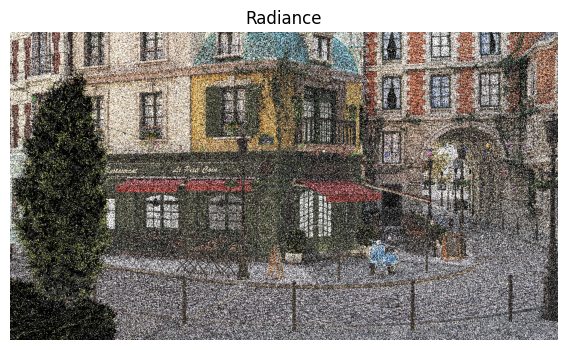

Epoch [400/1100],  Log_Likehood: -6.128126621246338 L2: 34.092525482177734 rL2: 34.217063903808594 used: 921553/921600
Epoch [410/1100],  Log_Likehood: -6.194720268249512 L2: 44.824005126953125 rL2: 43.714935302734375 used: 921553/921600
Epoch [420/1100],  Log_Likehood: -6.139745235443115 L2: 58.022300720214844 rL2: 56.146995544433594 used: 921553/921600
Epoch [430/1100],  Log_Likehood: -6.131643772125244 L2: 40.92228317260742 rL2: 40.58047866821289 used: 921553/921600
Epoch [440/1100],  Log_Likehood: -6.0761308670043945 L2: 34.99429702758789 rL2: 34.72245407104492 used: 921553/921600
Epoch [450/1100],  Log_Likehood: -6.153294086456299 L2: 46.612266540527344 rL2: 46.84748458862305 used: 921553/921600
Epoch [460/1100],  Log_Likehood: -6.142453193664551 L2: 35.54084014892578 rL2: 34.977108001708984 used: 921553/921600
Epoch [470/1100],  Log_Likehood: -6.125958442687988 L2: 36.16169357299805 rL2: 35.9625244140625 used: 921553/921600
Epoch [480/1100],  Log_Likehood: -6.2069196701049805 L2:

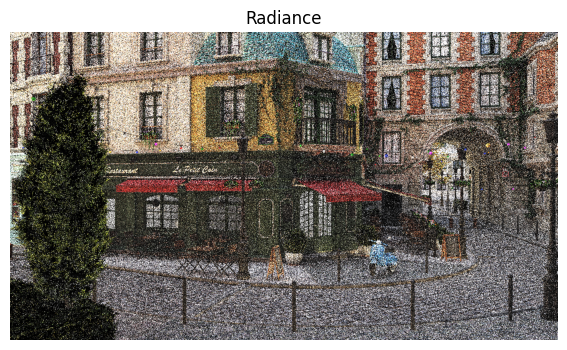

Epoch [600/1100],  Log_Likehood: -6.2047648429870605 L2: 30.89925765991211 rL2: 31.210908889770508 used: 921553/921600
Epoch [610/1100],  Log_Likehood: -6.251550674438477 L2: 34.53233337402344 rL2: 79.35591125488281 used: 921553/921600
Epoch [620/1100],  Log_Likehood: -6.213803768157959 L2: 35.823707580566406 rL2: 36.442054748535156 used: 921553/921600
Epoch [630/1100],  Log_Likehood: -6.251081943511963 L2: 40.93775177001953 rL2: 40.11328887939453 used: 921553/921600
Epoch [640/1100],  Log_Likehood: -6.20919942855835 L2: 37.68687057495117 rL2: 37.58354187011719 used: 921553/921600
Epoch [650/1100],  Log_Likehood: -6.257441997528076 L2: 44.187461853027344 rL2: 43.21437072753906 used: 921553/921600
Epoch [660/1100],  Log_Likehood: -6.254558086395264 L2: 35.781707763671875 rL2: 35.71078109741211 used: 921553/921600
Epoch [670/1100],  Log_Likehood: -6.209179401397705 L2: 32.79914474487305 rL2: 33.75886917114258 used: 921553/921600
Epoch [680/1100],  Log_Likehood: -6.068233489990234 L2: 25.

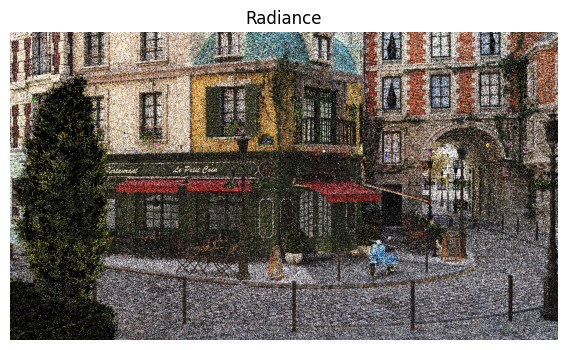

Epoch [800/1100],  Log_Likehood: -6.256752967834473 L2: 39.81682205200195 rL2: 39.386940002441406 used: 921553/921600
Epoch [810/1100],  Log_Likehood: -6.279933929443359 L2: 33.05208969116211 rL2: 33.489593505859375 used: 921553/921600
Epoch [820/1100],  Log_Likehood: -6.319477558135986 L2: 45.31800079345703 rL2: 44.70241165161133 used: 921553/921600
Epoch [830/1100],  Log_Likehood: -6.351341247558594 L2: 41.21607208251953 rL2: 41.97396469116211 used: 921553/921600
Epoch [840/1100],  Log_Likehood: -6.276287078857422 L2: 32.064239501953125 rL2: 33.31100082397461 used: 921553/921600
Epoch [850/1100],  Log_Likehood: -6.1433305740356445 L2: 30.431777954101562 rL2: 29.89259147644043 used: 921553/921600
Epoch [860/1100],  Log_Likehood: -6.320854187011719 L2: 31.20705223083496 rL2: 31.295875549316406 used: 921553/921600
Epoch [870/1100],  Log_Likehood: -6.292911529541016 L2: 44.088462829589844 rL2: 43.538429260253906 used: 921553/921600
Epoch [880/1100],  Log_Likehood: -6.341753005981445 L2: 

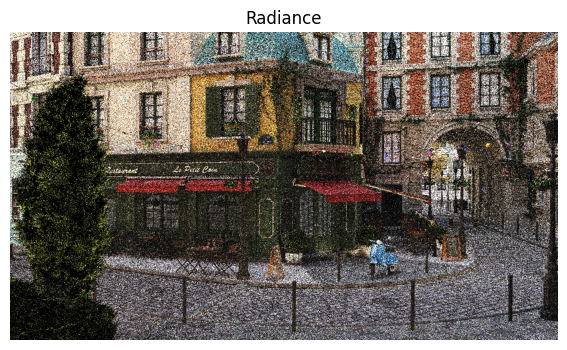

Epoch [1000/1100],  Log_Likehood: -6.387713432312012 L2: 32.9218635559082 rL2: 33.32313537597656 used: 921553/921600
Epoch [1010/1100],  Log_Likehood: None L2: 28.59903335571289 rL2: 29.846715927124023 used: 921553/921600
Epoch [1020/1100],  Log_Likehood: None L2: 26.89772605895996 rL2: 30.12726593017578 used: 921553/921600
Epoch [1030/1100],  Log_Likehood: None L2: 25.737470626831055 rL2: 27.80384635925293 used: 921553/921600
Epoch [1040/1100],  Log_Likehood: None L2: 25.584562301635742 rL2: 25.847103118896484 used: 921553/921600
Epoch [1050/1100],  Log_Likehood: None L2: 26.27048110961914 rL2: 25.968908309936523 used: 921553/921600
Epoch [1060/1100],  Log_Likehood: None L2: 32.2762336730957 rL2: 31.481876373291016 used: 921553/921600
Epoch [1070/1100],  Log_Likehood: None L2: 68.22069549560547 rL2: 64.02630615234375 used: 921553/921600
Epoch [1080/1100],  Log_Likehood: None L2: 32.338565826416016 rL2: 31.508270263671875 used: 921553/921600
Epoch [1090/1100],  Log_Likehood: None L2: 2

In [ ]:
def log_sum_exp(values, dim=1):
    # Subtract the maximum value to prevent overflow or underflow
    max_val = torch.max(values, dim=dim, keepdim=True)[0]
    stable_logsumexp = max_val + torch.log(torch.sum(torch.exp(values - max_val), dim=dim, keepdim=True))
    return stable_logsumexp

class VMFModel(torch.nn.Module):
    def __init__(self, width, height, K, alpha = 0.8, max_kappa=200,min_kappa=None, device=None, kappa_force=None, debug_amplitudes=True, normals=None, em_delay=0, batch_size=1):
        super(VMFModel, self).__init__()
        self.K = K
        self.max_kappa = max_kappa
        self.min_kappa = min_kappa
        self.num_pixels = width * height
        self.alpha = alpha
        self.em_delay = em_delay
        self.batch_size = 10
        self.device = device if device is not None else torch.device("cuda")
        self.params_per_lobe = 8
        self.vmf_coefficients = torch.zeros(self.num_pixels, K * self.params_per_lobe, device=self.device)
        self.S_data = torch.zeros((K, self.num_pixels, 3), device=self.device)
        self.S_weight_accum = torch.zeros((K, self.num_pixels, 1), device=self.device)
        self.stats_point_weight = torch.zeros((self.num_pixels, 1), device=self.device)
        self.accumulated_lum = torch.zeros((self.num_pixels, 1), device=self.device)
        self.amplitudes = torch.nn.Parameter(torch.zeros((self.num_pixels, K, 3), device=device_t))
        self.optimizer = torch.optim.Adam(self.parameters(), lr=gparams.ADAM_LR, betas=gparams.ADAM_BETAS)

        self.init_params(kappa_force, debug_amplitudes=debug_amplitudes, normals=normals)
        self.rL2 = 0

        self.params_per_pixel = K * (self.params_per_lobe - 1)
    
    def state_dict(self):
        state = {
            'K': self.K,
            'max_kappa': self.max_kappa,
            'min_kappa': self.min_kappa,
            'num_pixels': self.num_pixels,
            'alpha': self.alpha,
            'em_delay': self.em_delay,
            'batch_size': self.batch_size,
            'device': self.device,
            'params_per_lobe': self.params_per_lobe,
            'vmf_coefficients': self.vmf_coefficients,
            'S_data': self.S_data,
            'amplitudes': self.amplitudes.data,  # Include amplitudes
            'S_weight_accum': self.S_weight_accum,
            'stats_point_weight': self.stats_point_weight,
            'accumulated_lum': self.accumulated_lum,
            'params_per_pixel': self.params_per_pixel,
            'model_state': super().state_dict()  # Save the state of the nn.Module
        }
        return state

    def set_checkpoint_path(self, checkpoint_dir):
        os.makedirs(checkpoint_dir, exist_ok=True)
        self.checkpoint_path = os.path.join(checkpoint_dir, f'vmf_{self.params_per_pixel}_checkpoint.pth')

    def load_state_dict(self, state):
        self.K = state['K']
        self.max_kappa = state['max_kappa']
        self.min_kappa = state['min_kappa']
        self.num_pixels = state['num_pixels']
        self.alpha = state['alpha']
        self.em_delay = state['em_delay']
        self.batch_size = state['batch_size']
        self.device = state['device']
        self.params_per_lobe = state['params_per_lobe']
        self.vmf_coefficients = state['vmf_coefficients']
        self.S_data = state['S_data']
        self.amplitudes.data = state['amplitudes']  # Load amplitudes
        self.S_weight_accum = state['S_weight_accum']
        self.stats_point_weight = state['stats_point_weight']
        self.accumulated_lum = state['accumulated_lum']
        self.params_per_pixel = state['params_per_pixel']
        super().load_state_dict(state['model_state']) 

    def save_checkpoint(self, epoch, loss):
        if self.checkpoint_path:
            torch.save({
                'epoch': epoch,
                'model_state_dict': self.state_dict(),  # Use the updated state_dict
                'optimizer_state_dict': self.optimizer.state_dict(),
                'loss': loss,
                'rL2': self.rL2,
            }, self.checkpoint_path)

    def load_checkpoint(self, skip=False):
        if not skip and self.checkpoint_path and os.path.exists(self.checkpoint_path):
            checkpoint = torch.load(self.checkpoint_path)
            self.load_state_dict(checkpoint['model_state_dict'])
            self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
            epoch = checkpoint['epoch']
            loss = checkpoint['loss']
            self.rL2 = checkpoint['rL2']

            print(f"Checkpoint loaded: Epoch {epoch}, Loss {loss}")
            return epoch, loss
        else:
            return 0, None

    def init_params(self, kappa_force=None, debug_amplitudes=False, normals=None):
        # Fibonacci sphere sampling for mean direction initialization
        golden_ratio = (1 + 5 ** 0.5) / 2
        indices = torch.arange(0, self.K, dtype=torch.float32)
        theta = 2 * np.pi * indices / golden_ratio
        phi = torch.acos(1 - 2 * (indices + 0.5) / self.K)
        x = torch.cos(theta) * torch.sin(phi)
        y = torch.sin(theta) * torch.sin(phi)
        z = torch.cos(phi)

        mean_directions_init = torch.stack([x, y, z], dim=1).to(self.device)
        
        # Compute initial sharpness for kappa values based on direction pairs
        sharpness = self.calculate_kappa(kappa_force, mean_directions_init)
        if self.min_kappa is None:
            self.min_kappa = sharpness

        mean_directions_init = mean_directions_init.unsqueeze(0).repeat(self.num_pixels, 1, 1)
        print(mean_directions_init.shape)
        if normals is not None:
            # Assume normals are normalized and have shape (num_pixels, 3)
            mean_directions_init = self.reproject_to_tangent_space(normals, mean_directions_init)


        print(f"Kappa is init with value: {sharpness} for the {self.K} vMF lobes")

        # Initialize vmf_coefficients with new sharpness values
        for k in range(self.K):
            start = k * self.params_per_lobe
            self.vmf_coefficients[:, start:start+3] = mean_directions_init[:, k]
            self.vmf_coefficients[:, start+3] = torch.full((self.num_pixels,), sharpness, device=self.device)
            self.vmf_coefficients[:, start+4] = 1.0 / self.K

        # Debug amplitude initialization
        if debug_amplitudes:
            self.amplitudes.data = self.generate_colors(self.K, self.num_pixels, self.device)

    def calculate_kappa(self, kappa_force, mean_directions):
        if kappa_force is not None:
            return kappa_force
        minDP = 1.0
        for i in range(1, self.K):
            h = (mean_directions[i] + mean_directions[0])
            h = h / (h.norm(dim=-1, keepdim=True) + 0.00001)
            minDP = min(minDP, torch.dot(h, mean_directions[0]).item())
        if self.K == 1:
            return torch.tensor(1.0, device=self.device)
        else:
            return (torch.log(torch.tensor(0.65, device=self.device)) * self.K) / (minDP - 1.0001)

    def reproject_to_tangent_space(self, normals, directions):
        # Create local coordinate systems
        up = torch.tensor([0.0, 0.0, 1.0], device=self.device).expand_as(normals)
        tangent = torch.cross(normals, up)
        tangent = tangent / (tangent.norm(dim=1, keepdim=True) + 1e-10)  # Normalize
        bitangent = torch.cross(normals, tangent)
        bitangent = bitangent / (bitangent.norm(dim=1, keepdim=True) + 1e-10)

        # Expand directions to match each pixel
        expanded_directions = directions

        # Initialize the container for reprojected directions
        reprojected_directions = torch.zeros_like(expanded_directions)  # [num_pixels, K, 3]

        # Form the rotation matrix for each normal
        rotation_matrix = torch.stack([tangent, bitangent, normals], dim=-1)  # [num_pixels, 3, 3]

        # Reproject each lobe's directions
        for k in range(self.K):
            direction_k = expanded_directions[:, k, :]  # Now correctly indexing [num_pixels, 3]
            
            # Apply the rotation to the k-th direction vector
            reprojected_dir_k = torch.bmm(rotation_matrix, direction_k.unsqueeze(-1)).squeeze(-1)  # [num_pixels, 3]
            
            # Ensure the reprojected direction is in the upper hemisphere relative to the normals
            dot_products = torch.sum(reprojected_dir_k * normals, dim=1, keepdim=True)
            mask = dot_products < 0
            reprojected_dir_k[mask.squeeze(1)] *= -1

            # Store the reprojected direction back into the container
            reprojected_directions[:, k, :] = reprojected_dir_k

        return reprojected_directions


    def generate_colors(self, K, num_pixels, device):
        # Generate distinct colors by varying the hue in HSV space
        hues = torch.linspace(0, 1 - 1e-6, steps=K)  # Small epsilon to simulate endpoint=False
        colors = torch.zeros((K, 3), device=device)
        for i, hue in enumerate(hues):
            colors[i] = torch.tensor(self.hsv_to_rgb(hue, 1.0, 1.0))  # Saturation and Value are set to 1 for vibrant colors
        return colors.unsqueeze(1).expand(-1, num_pixels, -1).permute(1, 0, 2)  # Shape: (num_pixels, K, 3)

    def hsv_to_rgb(self, h, s, v):
        i = int(h * 6.)
        f = h * 6. - i
        p = v * (1. - s)
        q = v * (1. - f * s)
        t = v * (1. - (1. - f) * s)
        i = i % 6
        if i == 0:
            return [v, t, p]
        if i == 1:
            return [q, v, p]
        if i == 2:
            return [p, v, t]
        if i == 3:
            return [p, q, v]
        if i == 4:
            return [t, p, v]
        if i == 5:
            return [v, p, q]

    def forward(self, dirs, mask=None, debugID=None):
        return self.compute_radiance(dirs, mask, debugID)

    def compute_radiance(self, dirs, mask = None, debugID = None):
        num_pixels = dirs.shape[0]
        radiance = torch.zeros((num_pixels, 3), device=self.device)
        vmfs_ = self.vmf_coefficients
        amplitudes_ = self.amplitudes

        if mask != None:
            vmfs_ = vmfs_[mask]
            amplitudes_ = amplitudes_[mask]

        if debugID is not None:
            vmfs_ = self.vmf_coefficients[debugID].unsqueeze(0).repeat(num_pixels, 1)
            amplitudes_ = self.amplitudes[debugID].unsqueeze(0).repeat(num_pixels, 1, 1)


        for k in range(self.K):
            start_index = k * self.params_per_lobe
            mu = vmfs_[:, start_index:start_index+3]
            kappa = vmfs_[:, start_index+3]
            weight = vmfs_[:, start_index+4]
            mu = torch.nn.functional.normalize(mu, dim=1)
            amplitudes = amplitudes_[:, k]
            cos_theta = torch.einsum('ij,ij->i', dirs, mu)
            pdf_constant = kappa / (2 * torch.pi * (1.0 - torch.exp(-2.0 * kappa)))
            pdf_values = pdf_constant * torch.exp(kappa * (cos_theta - 1))
            amplitudes = torch.exp(amplitudes)
            assert(check_tensor(weight, "weight"))
            assert(check_tensor(pdf_values, "pdf_values"))
            assert(check_tensor(amplitudes, "amplitudes"))
            radiance += weight.unsqueeze(1) * pdf_values.unsqueeze(1) *amplitudes   # Assuming mu as amplitude
        return radiance

    def calculate_responsibilities(self, dirs, y_lum):
        num_pixels = dirs.shape[0]
        mus = torch.zeros((num_pixels, self.K, 3), device=dirs.device, dtype=dirs.dtype)
        kappas = torch.zeros((num_pixels, self.K), device=dirs.device, dtype=dirs.dtype)
        weights = torch.zeros((num_pixels, self.K), device=dirs.device, dtype=dirs.dtype)
        for k in range(self.K):
            start_idx = k * self.params_per_lobe
            mus[:, k, :] = self.vmf_coefficients[:, start_idx:start_idx+3]
            kappas[:, k] = self.vmf_coefficients[:, start_idx+3]
            weights[:, k] = self.vmf_coefficients[:, start_idx+4]


        if not gparams.SKIP_TENSOR_CHECK:
            row_sums = torch.sum(weights, dim=1)
            if not torch.allclose(row_sums, torch.ones_like(row_sums)):
                assert(check_tensor(responsibilities, "responsibilities", True))
                print("responsibilities Normalization check failed.")
                print("Row sums:", row_sums)
                assert(0)
        
        weights_sum = torch.sum(weights, dim=1)
        if not torch.allclose(weights_sum, torch.ones_like(weights_sum)):
            assert(check_tensor(weights_sum, "weights_sum", True))
            print("weights Normalization check failed.")
            print("Row sums:", weights_sum)
            assert(0)

        dot_products = torch.einsum('ijk,ik->ij', mus, dirs)

        pdf_constant = kappas / (2 * torch.pi * (1.0 - torch.exp(-2.0 * kappas)))

        pdf_values = pdf_constant * torch.exp(kappas * (dot_products - 1))


        pdf_values = pdf_values+1e-8
        responsibilities = weights * pdf_values
        responsibilities = responsibilities+1e-10
        log_likelihood = (torch.log(responsibilities)*y_lum).mean()
        #assert(check_tensor(responsibilities[0], "responsibilities_before_norm", True))

        eps = 1e-16
        responsibilities = responsibilities/(torch.sum(responsibilities, dim=1, keepdim=True)+eps)
        #responsibilities = torch.exp(responsibilities - log_sum_exp(responsibilities))

        
        assert(check_tensor(responsibilities, "responsibilities"))
        assert(check_tensor(responsibilities, "responsibilities"))


        if not gparams.SKIP_TENSOR_CHECK:
            row_sums = torch.sum(responsibilities, dim=1)

            assert(check_tensor(row_sums, "rows_sums"))
            if not torch.allclose(row_sums, torch.ones_like(row_sums)):
                assert(check_tensor(responsibilities, "responsibilities", True))
                print("responsibilities Normalization check failed.")
                print("Row sums:", row_sums)
                assert(0)

        assert(check_tensor(responsibilities, "responsibilities"))
        return responsibilities, log_likelihood

    def update_parameters(self, new_w, epoch):
        
        #norm = log_sum_exp(self.S_weight_accum, 0)
        #nw = torch.exp(self.S_weight_accum - norm)
        nw = self.S_weight_accum/torch.sum(self.S_weight_accum, dim=0, keepdim=True)
        
        for k in range(self.K):
            S_data_k = self.S_data[k]
            norm_S = torch.sqrt(torch.sum(S_data_k ** 2, dim=1, keepdim=True))

            eps = 1e-18
            new_mu = S_data_k / (norm_S + eps)
            assert(check_tensor(new_mu, "new_mu"))
            R_bar = norm_S / (self.S_weight_accum[k] + eps)
            assert(check_tensor(R_bar, "R_bar"))
            new_kappa = (R_bar * (3.0 - R_bar ** 2)) / (1.0 - R_bar ** 2 + eps)
            assert(check_tensor(new_kappa, "new_kappa"))
            new_kappa = torch.clamp(new_kappa, min=self.min_kappa, max=self.max_kappa)
            start = k * self.params_per_lobe
            old_weights = self.vmf_coefficients[:, start+4]


            assert(check_tensor(new_mu, "new_mu"))

            #new_weights = responsibilities[:, k] * weight_wo_responsibilities[:, k] + (1 - weight_wo_responsibilities[:, k]) * old_weights
            new_mu = new_mu*new_w+(1.0-new_w)*self.vmf_coefficients[:, start:start+3]
            new_mu = new_mu/(torch.sqrt(torch.sum(new_mu**2, dim=1, keepdim=True))+eps)
            
            self.vmf_coefficients[:, start:start+3] = new_mu
            #assert(check_tensor(self.vmf_coefficients[:, start+3], "old_kappa", True))
            new_kappa = new_kappa.squeeze()*new_w+self.vmf_coefficients[:, start+3]*(1.0-new_w)
            self.vmf_coefficients[:, start+3] = new_kappa
            #assert(check_tensor(self.vmf_coefficients[:, start+3], "new_kappa", True))
            #self.vmf_coefficients[:, start+4] = nw[k].squeeze()*new_w+self.vmf_coefficients[:, start+4]*(1.0-new_w)

            # Update weights using translated C++ logic

            if True:
                float_min = 1e-38  # Close to the smallest positive normal float
                mask = self.S_weight_accum[k] > float_min

                
                num_data = epoch
                
                new_weights = ((self.S_weight_accum[k] / (self.stats_point_weight + eps)) * num_data + 1e-2) / (num_data + self.K * 1e-2)

                
                mask = mask.squeeze()
                new_weights = new_weights.squeeze()
                
                self.vmf_coefficients[:, start+4][mask] = new_weights[mask]
                self.vmf_coefficients[:, start+4][~mask] = self.vmf_coefficients[:, start+4][~mask]  # Maintain previous weights where mask is False
            else:
                self.vmf_coefficients[:, start+4] = nw[k].squeeze()*new_w+self.vmf_coefficients[:, start+4]*(1.0-new_w)


            if not gparams.SKIP_TENSOR_CHECK and False:
                # Check if new_mu is normalized
                if not torch.allclose(torch.norm(new_mu, dim=1), torch.ones(new_mu.shape[0], device=new_mu.device), atol=1e-5):
                    check_tensor(torch.norm(new_mu, dim=1), "norm", True)
                    print(f"Normalization check failed for lobe {k}. Norms of new_mu:", torch.norm(new_mu, dim=1))
                    assert(0)
        
            #self.vmf_coefficients[:, start+3] = new_kappa.squeeze()
            #self.vmf_coefficients[:, start+4] = nw[k].squeeze()

            assert(check_tensor(new_mu, "new_mu"))

            
            assert(check_tensor(new_kappa, "new_kappa"))

            if epoch % 50 == 0 and False:
                assert(check_tensor(new_kappa, "new_kappa", True))




        # After the loop, re-normalize weights to ensure they sum to 1 across all K lobes for each pixel
        weight_sums = torch.sum(self.vmf_coefficients[:, 4::self.params_per_lobe], dim=1, keepdim=True)  # Sum weights across all K
        self.vmf_coefficients[:, 4::self.params_per_lobe] /= weight_sums  # Normalize weights
        assert(check_tensor(self.vmf_coefficients[:, 4::self.params_per_lobe], "new_weights"))

    def EM_step(self, epoch, dirs, y, update_params=True):
        assert(check_tensor(y, "y"))
        y_luminance = torch.norm(y,  dim=1, keepdim=True)

        
        y_luminance += 1e-8
        responsibilities, log_likehood = self.calculate_responsibilities(dirs, y_luminance)
        new_w = 1.0
        old_w = 1.0

        if self.alpha != 0.0:
            new_w = pow(epoch, -self.alpha)
            old_w = 1.0-new_w
        
        if epoch != 0:
            new_accum = y_luminance + self.accumulated_lum
            weight = y_luminance

            self.accumulated_lum = new_accum
        else:
            self.accumulated_lum = y_luminance
            weight = torch.ones((self.num_pixels, 1), device=self.device) * y_luminance

        self.stats_point_weight = old_w*self.stats_point_weight+new_w*weight
        weight = weight.expand(-1, self.K)

        if True:
            weight = weight * responsibilities
        else:
            weight = responsibilities

        assert(check_tensor(dirs, "dirs"))
        assert(check_tensor(responsibilities, "responsibilities"))
        assert(check_tensor(y_luminance, "y_luminance"))

        for k in range(self.K):
            self.S_data[k] = self.S_data[k]*old_w+dirs * weight[:, k].unsqueeze(1)*new_w
            self.S_weight_accum[k] = self.S_weight_accum[k]*old_w+weight[:, k].unsqueeze(1)*new_w

        assert(check_tensor(self.S_data, "S_data"))
        assert(check_tensor(self.S_weight_accum, "S_weight_accum"))
        assert(check_tensor(responsibilities, "responsibilities"))
        if (epoch > self.em_delay and (epoch % self.batch_size) == 0):
            self.update_parameters(new_w, epoch)
        return log_likehood

    def visualize_directions_for_pixel(self, pixel_id):
        """Visualizes the vMF directions for a given pixel ID."""
        if pixel_id >= self.num_pixels:
            print("Pixel ID is out of bounds.")
            return

        # Extract the direction vectors for the given pixel ID
        directions = self.vmf_coefficients[pixel_id, :].view(self.K, self.params_per_lobe)[:, :3]  # Assuming directions are stored in the first 3 columns

        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')
        ax.set_xlim([-1, 1])
        ax.set_ylim([-1, 1])
        ax.set_zlim([-1, 1])

        # Plot the origin
        ax.scatter([0], [0], [0], color='red', label='Origin')

        # Plot each direction vector
        for i in range(directions.shape[0]):
            x, y, z = directions[i].cpu().numpy()
            ax.quiver(0, 0, 0, x, y, z, length=1.0, normalize=True)

        ax.set_xlabel('X')
        ax.set_ylabel('Y')
        ax.set_zlabel('Z')
        ax.legend()
        plt.title(f'Direction Vectors for Pixel ID {pixel_id}')
        plt.show()




# Usage example
device_t = torch.device("cuda")


normals = mlDataOutput_ref["normal"]
# K = number of lobes, how many? I implemented online-em from the On-line Learning of Parametric Mixture Models for Light Transport Simulation. with the same regularization techniques, alpha value (convergence).
# lobes are generated using the Fibonacci sequence and only in the top hemisphere of a surface. that's why we forward the normals. batch = we need it, really. as in that paper. 
model_vmf = VMFModel(gparams.render_width, gparams.render_height, K=11,max_kappa=250, alpha=0.75, device=device_t, debug_amplitudes=False, normals=normals, em_delay=20, batch_size=50)
model_vmf.set_checkpoint_path(scene_cfg.checkpoint_dir)



EM_STEPS = gparams.num_training_frames  # number of epochs
EM_STEPS= 1000
AMPLITUDE_DELAY = 20

AMPLITUDE_ADDITIONAL_STEPS = 100

Visualize = True

N = EM_STEPS+AMPLITUDE_ADDITIONAL_STEPS
start_epoch = 0
start_epoch, _ = model_vmf.load_checkpoint(skip=True)
scene_cfg.prepare_scene(ref_scene)

isFirstWas = False

estimation_rad = model_vmf(mlDataOutput["dir"])

if start_epoch > N:
    start_epoch = N
    model_vmf.rL2 = 0

re_accum = 1
for epoch in range(start_epoch, N + gparams.OnlyLossEpoch):
    start_render = time.time()
    trainFrame()

    # Get the newly rendered data
    mlDataOutput = falcor_to_torch_split_interleaved(ml_data, field_types)

    dirs = mlDataOutput["dir"]
    # Find any vectors that are significantly off from length 1
    lengths = torch.sqrt(torch.sum(dirs ** 2, dim=1, keepdim=True))
    tolerance = 1e-5  # Set a tolerance level for floating point precision
    
    global incorrect_indices
    incorrect_indices = torch.where(torch.abs(lengths - 1) > tolerance)[0]
    
    # (#pixels, 3)
    y = mlDataOutput["radiance"].clone()
    pdf = safe_pdf(mlDataOutput["pdf"].clone())
    mask = get_mask_for_training(y)
    

    y = torch.relu(y)

    y[~mask] = 0
    dirs[~mask, :] = 0.0
    dirs[~mask, 0] = 1.0
    loss_val = None
    l2 = None
    used = torch.count_nonzero(mask).item()
    all = mask.shape[0]

    if epoch >= AMPLITUDE_DELAY:
        
        
        loss_epoch = epoch-N
        bTrainNow = loss_epoch < 0
        if bTrainNow:
            model_vmf.optimizer.zero_grad()   
        # Forward pass

        
        estimation_rad = model_vmf(dirs)
        
        # Simulate a target for loss calculation
        target = torch.randn(model_vmf.num_pixels, 3, device=device_t)
        #inf_mask = torch.isinf(estimation_rad)

        def plot_radiance(radiance, title="Radiance"):
            plt.figure(figsize=(10, 4))
            radiance_np = radiance.detach().cpu().numpy()
            plt.imshow(np.clip(radiance_np.reshape(gparams.render_height, gparams.render_width, 3), 0, 1))
            plt.title(title)
            plt.axis('off')
            plt.show()

        #estimation_rad[~mask] = 0.0
        
        y_masked = y[mask]
        estimation_rad_masked = estimation_rad[mask]
        batch_pdf = pdf[mask]

        batch_y = y_masked

        if bTrainNow:
            loss = relativeL2_PDF_NotApplied(estimation_rad_masked, y_masked, pdf=batch_pdf, div=estimation_rad_masked)
            total_loss = loss 

            loss_val = loss.item()
        else:
            loss_val = 0


        rL2 = loss
        if bTrainNow:
            if epoch == 0 and batch_index == 0:
                model_vmf.rL2 = rL2
            model_vmf.rL2 = rL2*0.90+model_vmf.rL2*0.10
        else:
            overe = 1.0 / re_accum
            model_vmf.rL2 = rL2* overe + (1-overe) * model_vmf.rL2
            re_accum += 1
    
        # Backward and optimize
        if bTrainNow:
            # backpropate to optimize the Amplitude
            loss.backward()

        if epoch == AMPLITUDE_DELAY:
            average_loss = loss
        else:
            alpha = 0.95
            average_loss = average_loss*alpha+(1.0-alpha)*loss
        
        # Backward and optimize
        if bTrainNow:
            torch.nn.utils.clip_grad_norm_(model_vmf.parameters(),  5000)
            model_vmf.optimizer.step()

        

        if (loss_val == 0 or math.isinf(loss_val) or math.isnan(loss_val)) and bTrainNow and False:
            #print(loss_val)
            start_epoch, _ = model_vmf.load_checkpoint(skip=False)
            epoch = start_epoch
            print("RESTART!")
            continue
        
    log_likehood = None
    if epoch < EM_STEPS:
        log_likehood = model_vmf.EM_step(epoch+1, dirs, y).item()
        if (epoch+1) % 100 == 0 and False:
            model_vmf.visualize_directions_for_pixel(0)

    conditions = [
            (100, 10),
            (25, 5),
            (50, 50),
    ]
    
    if (epoch + 1) % 100 == 0:
        model_vmf.save_checkpoint(epoch, average_loss)
    if should_visualize(epoch, conditions) and (bTrainNow or not isFirstWas) and Visualize:
        plot_radiance(estimation_rad/pdf)
    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{N}],  Log_Likehood: {log_likehood} L2: {loss_val} rL2: {model_vmf.rL2} used: {used}/{all}')
    isFirstWas = True

C:\Users\Mikhail Dereviannykh\AppData\Local\Temp\ipykernel_20032\1148533164.py:18: RuntimeWarning: divide by zero encountered in divide
  colors = colors/np.max(colors)
C:\Users\Mikhail Dereviannykh\AppData\Local\Temp\ipykernel_20032\1148533164.py:18: RuntimeWarning: invalid value encountered in divide
  colors = colors/np.max(colors)


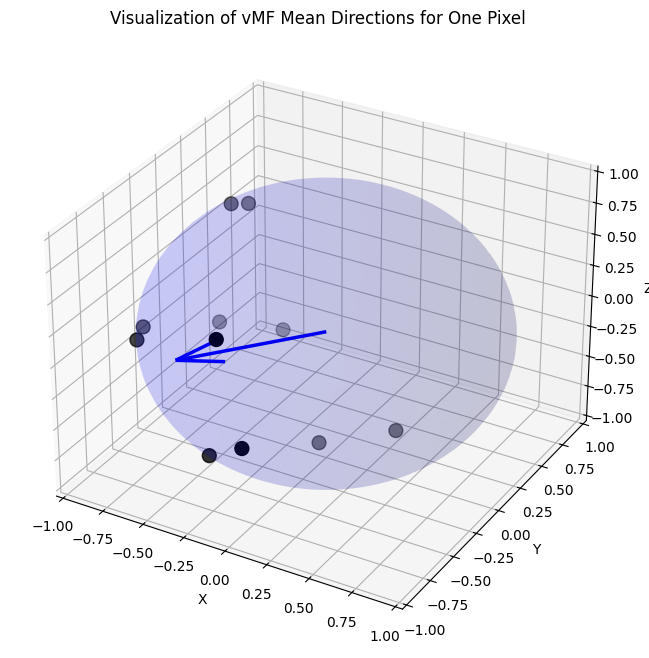

In [ ]:

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

def plot_vmf_directions(model_vmf, pixel_index, normal=None):
    # Extract the mean direction components for the specified pixel across all K components
    x = model_vmf.vmf_coefficients[pixel_index, 0:model_vmf.K*model_vmf.params_per_lobe:model_vmf.params_per_lobe].cpu().numpy()
    y = model_vmf.vmf_coefficients[pixel_index, 1:model_vmf.K*model_vmf.params_per_lobe:model_vmf.params_per_lobe].cpu().numpy()
    z = model_vmf.vmf_coefficients[pixel_index, 2:model_vmf.K*model_vmf.params_per_lobe:model_vmf.params_per_lobe].cpu().numpy()
    
    # Extract the amplitudes for colors
    

    colors = torch.relu(model_vmf.amplitudes[pixel_index]).detach().cpu().numpy()
    colors = colors/np.max(colors)

    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Plot the mean directions with colors
    ax.scatter(x, y, z, color=colors, s=100)

    # Draw a sphere for reference
    u = np.linspace(0, 2 * np.pi, 100)
    v = np.linspace(0, np.pi, 100)
    x_sphere = np.outer(np.cos(u), np.sin(v))
    y_sphere = np.outer(np.sin(u), np.sin(v))
    z_sphere = np.outer(np.ones(np.size(u)), np.cos(v))
    ax.plot_surface(x_sphere, y_sphere, z_sphere, color='b', alpha=0.1)  # Transparent blue sphere

    # If normal is provided, plot it
    if normal is not None:
        ax.quiver(0, 0, 0, normal[0], normal[1], normal[2], length=1.0, color='blue', linewidth=2.5)

    ax.set_xlim([-1, 1])
    ax.set_ylim([-1, 1])
    ax.set_zlim([-1, 1])
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title('Visualization of vMF Mean Directions for One Pixel')

    plt.show()

# Assuming model_vmf, pixel_index, and normal are defined and initialized as in previous usage examples


plot_vmf_directions(model_vmf, pixel_index=scene_cfg.validation_points[0].id, normal=scene_cfg.validation_points[0].n)




# Experiment preview

In [ ]:
from matplotlib import colors
gt_render_cache = None

def aces_tonemap(image, exposure=1.0):
    """
    ACES tonemapping function.
    :param image: Input HDR image.
    :param exposure: Exposure factor.
    :return: Tonemapped image.
    """
    a = 2.51
    b = 0.03
    c = 2.43
    d = 0.59
    e = 0.14

    mapped = exposure * image
    return ((mapped * (a * mapped + b)) / (mapped * (c * mapped + d) + e))

def apply_gamma_correction(image):
    """
    Applies gamma correction to the image.
    :param image: Input image to correct.
    :return: Gamma corrected image.
    """
    gamma = 2.2
    image = np.power(image, 1.0 / gamma)
    image = (image*255).astype(np.uint8)
    return image

class ExperimentPreview:
    num_samples: int
    scene_cfg: SceneConfig

    showNIRC: bool
    showSH: bool
    showVMF: bool

    def __init__(self, scene_cfg: SceneConfig, num_samples: int = 64, showNIRC: bool = True, showSH: bool = True, showVMF: bool = True, showNIRCEQMem = True):
        self.num_samples = num_samples
        self.scene_cfg = scene_cfg
        self.showNIRC = showNIRC
        self.showNIRCEQMem = showNIRCEQMem
        self.showSH = showSH
        self.showVMF = showVMF
        

    def do(self, gt_render = None):
        global gt_render_cache
        if gt_render == None:
            if gt_render_cache is None:
                self.scene_cfg.prepare_scene(ref_scene)
                gt_render_cache = frameRender(num_samples=1024, tonemapped=True, vis=False)
            
            gt_render = gt_render_cache


        
            

        
        fig, ax = plt.subplots(1)
        pi_colors = ['red', 'green', 'blue', 'cyan', 'magenta', 'yellow', 'black', 'white']

        ax.imshow(gt_render)

        for i, p in enumerate(scene_cfg.validation_points):
            color = pi_colors[i % len(pi_colors)]
            circle = patches.Circle((p.x, p.y), gparams.render_width // 100, facecolor=color, edgecolor='black', linewidth=(gparams.render_width // 500))
            ax.add_patch(circle)
        
        plt.show()
        plt.savefig(os.path.join(scene_cfg.checkpoint_dir, f'experiment_preview.png'))

        n_cameras = len(scene_cfg.validation_points)
        figure, axes = plt.subplots(n_cameras, 5, figsize=(25, 5 * n_cameras))  # Adding another column for SH render
        figure.suptitle('Ground Truth, Predicted Renders, and SH Renders', fontsize=16)

        if n_cameras == 1:
            axes = np.array([axes])
        
        for i, c in enumerate(scene_cfg.validation_points):
            scene_cfg.prepare_scene(ref_scene, debugPointID=i)
            validation_gt_render = frameRender(num_samples=self.num_samples, vis=False, tonemapped=False, directEmissive=False, directSky=True)

            # Extract pixel-specific data
            pi = c.id

            # Generate rays and other inputs for the model
            mlDataRaysOutput = falcor_to_torch_split_interleaved(ml_rays_data, rays_fields)
            positions = mlDataRaysOutput["worldpos"]
            directions = mlDataRaysOutput["dir"]

            color = mlDataOutput_ref["color"][pi]
            r = mlDataOutput_ref["roughness"][pi]
            n = mlDataOutput_ref["normal"][pi]

            exposure = 0.5

            tonemapped_gt = apply_gamma_correction(aces_tonemap(validation_gt_render, exposure=exposure))
                    
            # Visualization
            axes[i, 0].imshow(tonemapped_gt)
            axes[i, 0].set_title('Ground Truth', fontsize=10)

            if self.showNIRC:
                roughness = r[None, :] * torch.ones((positions.shape[0], 1), device=positions.device)
                colors_arr = color[None, :] * torch.ones((positions.shape[0], 1), device=positions.device)
                normals = n[None, :] * torch.ones((positions.shape[0], 1), device=positions.device)


                X = nirc_model.prepare_input_(positions, directions, colors_arr, roughness, normals)
                assert X.shape[1] == 12, 'Input shape mismatch'
                Y = nirc_model(X).detach()
                Y_image = Y.view(gparams.render_height, gparams.render_width, 3).detach().cpu().numpy()
                Y_image = Y_image.astype(np.float32)
                l2_error_model = np.linalg.norm(validation_gt_render - Y_image) / np.sqrt(validation_gt_render.size)
                tonemapped_nirc = apply_gamma_correction(aces_tonemap(Y_image, exposure=exposure))
                
                # Adding colored padding
                padding = gparams.render_width // 100
                padded_image = np.pad(tonemapped_nirc, ((padding, padding), (padding, padding), (0, 0)), mode='constant', constant_values=0)
                
                padded_image[:padding, :, :] = colors.to_rgb(pi_colors[i % len(pi_colors)])
                padded_image[-padding:, :, :] = colors.to_rgb(pi_colors[i % len(pi_colors)])
                padded_image[:, :padding, :] = colors.to_rgb(pi_colors[i % len(pi_colors)])
                padded_image[:, -padding:, :] = colors.to_rgb(pi_colors[i % len(pi_colors)])
                
                plt.imsave(os.path.join(scene_cfg.checkpoint_dir, f'experiment_nirc.png'), padded_image)

                axes[i, 1].imshow(padded_image)
                axes[i, 1].set_title(f'NIRC Render L2 error = {l2_error_model:.4f}, rL2 = {nirc_model.rL2:.4f}', fontsize=10)
                
            if self.showNIRCEQMem:
                roughness = r[None, :] * torch.ones((positions.shape[0], 1), device=positions.device)
                colors_arr = color[None, :] * torch.ones((positions.shape[0], 1), device=positions.device)
                normals = n[None, :] * torch.ones((positions.shape[0], 1), device=positions.device)

                pixel_indices = torch.ones((positions.shape[0]), device=positions.device) * pi  
                pixel_indices = torch.stack((pixel_indices % gparams.render_width, pixel_indices // gparams.render_width), dim=1).to(torch.int) 
                
                ddir = directions
                norm = (torch.square(torch.sum(ddir**2, dim=1)) + 1.0e-10).unsqueeze(1)
                ddir = ddir / norm
                dirs = ddir * 0.5 + 0.5

                normals = cart_to_sph(normals)

                X = torch.cat((normals, roughness, colors_arr, dirs), dim=1)
                Y = nirc_eqmem_model(X, pixel_indices=pixel_indices).detach()
                Y_image = Y.view(gparams.render_height, gparams.render_width, 3).detach().cpu().numpy()
                Y_image = Y_image.astype(np.float32)
                l2_error_model = np.linalg.norm(validation_gt_render - Y_image) / np.sqrt(validation_gt_render.size)
                tonemapped_nirc_eqmem = apply_gamma_correction(aces_tonemap(Y_image, exposure=exposure))
                
                # Adding colored padding
                padding = gparams.render_width // 100
                padded_image = np.pad(tonemapped_nirc_eqmem, ((padding, padding), (padding, padding), (0, 0)), mode='constant', constant_values=0)
                padded_image[:padding, :, :] = colors.to_rgb(pi_colors[i % len(pi_colors)])
                padded_image[-padding:, :, :] = colors.to_rgb(pi_colors[i % len(pi_colors)])
                padded_image[:, :padding, :] = colors.to_rgb(pi_colors[i % len(pi_colors)])
                padded_image[:, -padding:, :] = colors.to_rgb(pi_colors[i % len(pi_colors)])

                plt.imsave(os.path.join(scene_cfg.checkpoint_dir, f'experiment_nirc_eqmem.png'), padded_image)
                
                axes[i, 2].imshow(padded_image)
                axes[i, 2].set_title(f'NIRC PerPixel Render L2 error = {l2_error_model:.4f}, rL2 = {nirc_eqmem_model.rL2:.4f}', fontsize=10)
                
            if self.showSH:
                # SH Rendering
                shs_render = sh_model(directions, debugID=pi)

                shs_render_image = shs_render.view(gparams.render_height, gparams.render_width, 3).detach().cpu().numpy()
                shs_render_image = shs_render_image.astype(np.float32)
                l2_error_sh = np.linalg.norm(validation_gt_render - shs_render_image)/ np.sqrt(validation_gt_render.size)
                tonemapped_shs = apply_gamma_correction(aces_tonemap(shs_render_image, exposure=exposure))
                
                # Adding colored padding
                padding = gparams.render_width // 100
                padded_image = np.pad(tonemapped_shs, ((padding, padding), (padding, padding), (0, 0)), mode='constant', constant_values=0)
                padded_image[:padding, :, :] = colors.to_rgb(pi_colors[i % len(pi_colors)])
                padded_image[-padding:, :, :] = colors.to_rgb(pi_colors[i % len(pi_colors)])
                padded_image[:, :padding, :] = colors.to_rgb(pi_colors[i % len(pi_colors)])
                padded_image[:, -padding:, :] = colors.to_rgb(pi_colors[i % len(pi_colors)])

                plt.imsave(os.path.join(scene_cfg.checkpoint_dir, f'experiment_sh.png'), padded_image)

                axes[i, 3].imshow(padded_image)
                axes[i, 3].set_title(f'SH Render L2 error = {l2_error_sh:.4f}, rL2 = {sh_model.rL2:.4f}', fontsize=10)

            if self.showVMF:
                vmf_render = model_vmf(directions, debugID=pi)  # Adjust based on your vmf_coefficients structure
                vmf_render_image = vmf_render.view(gparams.render_height, gparams.render_width, 3).detach().cpu().numpy()
                vmf_render_image = vmf_render_image.astype(np.float32)
                l2_error_vmf = np.linalg.norm(validation_gt_render - vmf_render_image)/ np.sqrt(validation_gt_render.size)
                tonemapped_vmf = apply_gamma_correction(aces_tonemap(vmf_render_image, exposure=exposure))
                
                # Adding colored padding
                padding = gparams.render_width // 100
                padded_image = np.pad(tonemapped_vmf, ((padding, padding), (padding, padding), (0, 0)), mode='constant', constant_values=0)
                padded_image[:padding, :, :] = colors.to_rgb(pi_colors[i % len(pi_colors)])
                padded_image[-padding:, :, :] = colors.to_rgb(pi_colors[i % len(pi_colors)])
                padded_image[:, :padding, :] = colors.to_rgb(pi_colors[i % len(pi_colors)])
                padded_image[:, -padding:, :] = colors.to_rgb(pi_colors[i % len(pi_colors)])

                plt.imsave(os.path.join(scene_cfg.checkpoint_dir, f'experiment_vmf.png'), padded_image)

                axes[i, 4].imshow(padded_image)
                axes[i, 4].set_title(f'vMF Render L2 error = {l2_error_vmf:.4f}, rL2 = {model_vmf.rL2:.4f}', fontsize=10)
            

        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.savefig(os.path.join(scene_cfg.checkpoint_dir, f'experiment_full_result.png'))
        plt.show()

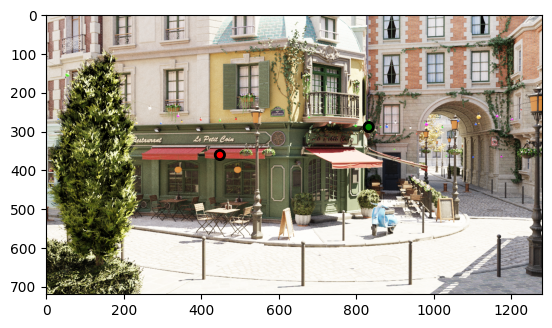

NameError: name 'nirc_eqmem_model' is not defined

<Figure size 640x480 with 0 Axes>

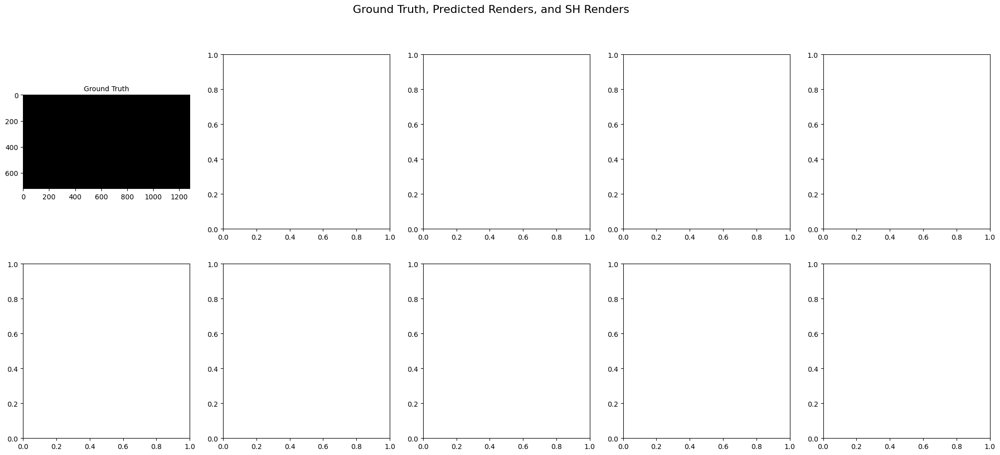

In [ ]:

ex = ExperimentPreview(scene_cfg=scene_cfg, showNIRC=False, showSH=True, showVMF=True)
ex.do()

In [ ]:
stop

NameError: name 'stop' is not defined

In [ ]:

# if you just want to fly around in the scene. F2 toggles UI on
while True:
    testbed.frame()

# NCV MODEL

In [ ]:
ref_input, _ =  nrc_model.prepare_input(mlDataOutput_ref, camera_position_tensor)
ref_integral_values = nrc_model(ref_input, mlDataOutput_ref["color"]).detach()

In [ ]:
from zunis.models.flows.sampling import UniformSampler
from zunis.training.weighted_dataset.stateful_trainer import StatefulTrainer

class NCVModel(torch.nn.Module):
    def __init__(self, width, height, integral_model, coord_system="cylindrical", optional_features=True, model="default"):
        super(NCVModel, self).__init__()
        sampler=UniformSampler(d=2, device=device_t)
        self.optional_features = optional_features
        self.coord_system = coord_system
        flow_options = {'cell_params':{'d_opt_feats': 9*self.optional_features+0, "n_bins": 10, "model": model}, "masking_options": {"repetitions": 1}}
        self.trainer = StatefulTrainer(d=2, loss="dkl", flow_options=flow_options, flow="pwquad", flow_prior=sampler, device=device_t)
        self.integral_model = integral_model
        self.checkpoint_path = None

        if not optional_features:
            print("Warning, the model is training without the features. use it only for 1 pixel training!")


    def set_checkpoint_path(self, checkpoint_dir):
        os.makedirs(checkpoint_dir, exist_ok=True)
        self.checkpoint_path = os.path.join(checkpoint_dir, f'ncv_checkpoint.pth')

    def save_checkpoint(self, epoch, dkl_loss, loss):
        if self.checkpoint_path:
            torch.save({
                'epoch': epoch,
                'model_state_dict': self.state_dict(),
                'flow_sate_dict' : self.trainer.flow.state_dict(),
                'flows0_inverse' : self.trainer.flow.flows[0].transform.inverse,
                'flows1_inverse' : self.trainer.flow.flows[1].transform.inverse,
                'dkl_loss': dkl_loss,
                'loss': loss,
                }, self.checkpoint_path)

    def load_checkpoint(self, skip=False):
        if not skip and self.checkpoint_path and os.path.exists(self.checkpoint_path):
            
            checkpoint = torch.load(self.checkpoint_path)

            self.load_state_dict(checkpoint['model_state_dict'])
            self.trainer.flow.load_state_dict(checkpoint['flow_sate_dict'])
            self.trainer.flow.flows[0].transform.inverse = checkpoint['flows0_inverse']
            self.trainer.flow.flows[1].transform.inverse = checkpoint['flows1_inverse']

            epoch = checkpoint['epoch']
            dkl_loss = checkpoint['dkl_loss']
            loss = checkpoint['loss']
            print(f"Checkpoint loaded: Epoch {epoch}, Loss {loss}")

            return epoch, dkl_loss, loss
        else:
            return 0, None, None

    def toCylindrical(self, dirs):
        # Calculate the radial component 'r'
        r = torch.sqrt(dirs[:, 0]**2 + dirs[:, 1]**2)*torch.sign(dirs[:, 2])

        # Calculate the azimuthal angle 'phi'
        phi = torch.atan2(dirs[:, 1], dirs[:, 0])

        # If you want to keep the z component for some reason:
        z = dirs[:, 2]  # This would be useful if you need the full cylindrical coordinates

        # Now you have the 2D cylindrical components (r, phi)
        # You can choose to create a new tensor with these if needed:
        phi = r

        jacobian = torch.abs(r)/ (4 * torch.pi)
        r = r*0.5+0.5
        phi = (phi+torch.pi)/ (2 * torch.pi)
        cylindric = torch.stack((r, phi), dim=1)
        assert(check_tensor(cylindric, "cylindric", min=0.0, max=1.0))
        assert(check_tensor(jacobian, "jacobian", min=0.000001))


        return cylindric, jacobian
    
    def toSpherical(self, dirs):
        # Calculate the radial distance

        # Calculate the polar angle 'theta'
        theta = torch.atan2(torch.sqrt(dirs[:, 0]**2 + dirs[:, 1]**2), dirs[:, 2])

        # Calculate the azimuthal angle 'phi'
        phi = torch.atan2(dirs[:, 1], dirs[:, 0])

        # Normalize the spherical coordinates
        theta_norm = theta / torch.pi  # Mapping theta from [0, pi] to [0, 1]
        phi_norm = (phi + torch.pi) / (2 * torch.pi)  # Mapping phi from [-pi, pi] to [0, 1]
        spherical = torch.stack((theta_norm, phi_norm), dim=1)
        spherical = torch.clamp(spherical, 0.0, 1.0)  # Ensure all values are within [0, 1]

        # Calculate the Jacobian for the spherical transformation
        jacobian = torch.sin(theta) / (4 * torch.pi**2)
        assert(check_tensor(spherical, "spherical", min=0.0, max=1.0))
        assert(check_tensor(jacobian, "jacobian", min=0.000001))
        return spherical, jacobian

        
    def transform_coordinates(self, x):
        if self.coord_system == "cylindrical":
            return self.toCylindrical(x)
        elif self.coord_system == "spherical":
            return self.toSpherical(x)
        else:
            assert(0)

    def get_integral_estimations(self, integral_input, colors, integral_values=None):
        # here must be a loop over all RGB channels
        if integral_values is None:
            predicted_integral = self.integral_model(integral_input, colors)  # Use only the Red channel
        else:
            predicted_integral = integral_values

        return predicted_integral

    # debugID is used for debug visualization. look at the other models + scroll down to see the comparision figures. you may want to use it for the debugging purposes.
    def forward(self, dirs, features, integral_input, integral_values=None, debugID=None, mask=None, train=False, detach=False):
        # here must be a loop over all RGB channels
        batch_size = dirs.size(0)
        x, pdf = self.transform_coordinates(dirs)

        px = torch.ones(x.shape[0], device=device_t)
        xd = torch.cat((x,px.unsqueeze(-1)),-1)
        
        if not self.optional_features:
            features = None


        if integral_values is None:
            predicted_integral = self.integral_model(integral_input).detach()[:, 0]  # Use only the Red channel
        else:
            predicted_integral = integral_values[:, 0].unsqueeze(-1)

        q=self.trainer.flow(xd, opt_feats=features)

        jacobian = q[:, -1]+torch.log(pdf)
        jacobian = torch.exp(jacobian.detach().unsqueeze(-1))
               
        return torch.relu(predicted_integral*jacobian)


    def train(self, dirs,features, radiance, pdf_cartesian, optimizer):
        # here must be a loop over all RGB channels
        x, pdf = self.transform_coordinates(dirs)
        pdf += 0.00001
        assert(check_tensor(pdf, "pdf_cylindrical", min=0.000001))
        pdf_final = pdf_cartesian[:, 0]*pdf + 0.0001
        

        radiance = radiance+0.0001
        

        assert(check_tensor(x, "train_x", min=0.0, max=1.0))
        assert(check_tensor(radiance, "train_radiance", min=0.00000001))
        assert(check_tensor(features, "train_features", min=0.0, max=1.0))
        assert(check_tensor(pdf_final, "pdf", min=0.00001))


        if not self.optional_features:
            features = None
        # can we get log-likehood estimations from the training? if so, we want to print it as the loss function to asses the convergence
        loss = self.trainer.train_step_on_target_minibatch(x=x,px=pdf_final,fx=radiance, opt_feats=features, optim=optimizer)
        return loss




ncv_model = NCVModel(width=gparams.render_width, height=gparams.render_height, integral_model=nrc_model, coord_system="spherical", optional_features=True, model="oneblob").to(device_t)
ncv_model.set_checkpoint_path(scene_cfg.checkpoint_dir)

N = gparams.num_training_frames  # number of epochs

batch_size = 100000
optimizer = torch.optim.Adam(ncv_model.trainer.flow.parameters(), lr=0.001, betas=[0.9, 0.999])

scene_cfg.prepare_scene(ref_scene)

B = 16  # number of batches
simulate_tiles = False # like in the original NRC work. we only sample 1 pixel out of 4 for training
tile_width, tile_height = 4, 4  # Sampling one point per 2x2 tile

debug_train_id = scene_cfg.validation_points[0].id
debug_train_id = None

# do we want to introduce batches?
divide_by_estimation = True
use_cached_estimation = True

average_kld_loss = 0.0
average_l2_loss = 0.0

relative_error = False
for epoch in range(N):
    if debug_train_id is not None:
        B = 1

    start_time = time.time()

    trainFrame()
    mlDataOutput = falcor_to_torch_split_interleaved(ml_data, field_types)

    radiance = mlDataOutput["radiance"].clone()
    thp = mlDataOutput["thp"]

    radiance = radiance#*thp


    x = mlDataOutput["dir"]
    norm = (torch.square(torch.sum(x**2, dim=1))+0.000001)
    norm = torch.unsqueeze(norm, dim=1)
    x = x/norm

    pdf_cartesian = mlDataOutput["pdf"] 

    colors = mlDataOutput["color"] 
    #pdf_cartesian = mlDataOutput["pdf"]*0+1.0/(2*torch.pi) # lets assume that we have diffuse surfaces for a moment    

    # we normalize all features to make sure that they're in range from [0 to 1], it'll be important for the future one-blob encoding. and then concat them into one tensor
    features = packModelInput(mlDataOutput["worldpos"], None, mlDataOutput["color"], mlDataOutput["roughness"], mlDataOutput["normal"]).to(torch.float32)
    
    features = torch.clamp(features, 0.0, 1.0) # we gotta do it


    
    integral_input, _ = ncv_model.integral_model.prepare_input(mlDataOutput, camera_position_tensor)


    width, height = gparams.render_width, gparams.render_height
    total_samples = features.size()[0]
    samples_per_batch = total_samples // B

    loss_dkl_v = 0.0
    loss_l2_v = 0.0
    
    for batch_index in range(B):
        # Apply tiling to the current batch
        batch_indices = vectorized_uniform_stratified_sampling(width, height, tile_width, tile_height)
        batch_indices = batch_indices[:samples_per_batch]  # Ensure the batch size matches

        dirs_batch_ = x[batch_indices]
        features_batch_ = features[batch_indices]
        pdf_batch_ = pdf_cartesian[batch_indices]
        radiance_batch_ = radiance[batch_indices]

        mask = get_mask_for_training(radiance_batch_, False)
        dirs_batch = dirs_batch_[mask]
        features_batch = features_batch_[mask]
        pdf_batch = pdf_batch_[mask]
        
        radiance_batch_ = radiance_batch_[:, 0]
        radiance_batch = radiance_batch_[mask]

        integral_input_batch = integral_input[batch_indices][mask]
        colors_batch = colors[batch_indices][mask]

        integral_values = None
        if use_cached_estimation:
            integral_values = ref_integral_values[batch_indices][mask]


        if debug_train_id is not None:
            dirs_batch = torch.unsqueeze(x[debug_train_id], dim=0)
            features_batch = torch.unsqueeze(features[debug_train_id], dim=0)
            pdf_batch = torch.unsqueeze(pdf_cartesian[debug_train_id], dim=0)
            pdf_batch_ = torch.unsqueeze(pdf_cartesian[debug_train_id], dim=0)
            radiance_batch = torch.unsqueeze(radiance[debug_train_id], dim=0)
            radiance_batch_ = torch.unsqueeze(radiance[debug_train_id], dim=0)[:, 0]
            features_batch_ = torch.unsqueeze(features[debug_train_id], dim=0)
            colors_batch = torch.unsqueeze(colors[debug_train_id], dim=0)
            dirs_batch_ = torch.unsqueeze(x[debug_train_id], dim=0)
            integral_input_batch = torch.unsqueeze(integral_input[debug_train_id], dim=0)
            if use_cached_estimation:
                integral_values = torch.unsqueeze(ref_integral_values[debug_train_id], dim=0)


        if debug_train_id is not None and torch.any(radiance_batch < 0.0):
            continue
            
        estimations = ncv_model.get_integral_estimations(colors = colors_batch,integral_input=integral_input_batch, integral_values=integral_values)
        
        
        loss_radiance = radiance_batch
        if divide_by_estimation:
            radiance_batch = radiance_batch/estimations[:, 0]

        loss_dkl = ncv_model.train(dirs=dirs_batch, features=features_batch, pdf_cartesian=pdf_batch, radiance=radiance_batch, optimizer=optimizer)
        loss_dkl_v += loss_dkl
        


        predictions = ncv_model(dirs_batch_, integral_input=None, integral_values=estimations, features=features_batch_, mask=batch_indices, debugID=debug_train_id, train=True, detach=True)

        denominator = torch.norm(outputs.detach(), dim=1).view(-1,1) + gparams.relative_error_eps if gparams.relative_error else 1.0
        loss_e = ((loss_radiance - predictions)**2 / denominator).mean()
        loss_l2_v += loss_e.item()
        

    end_time = time.time()

    loss_dkl_v = loss_dkl_v/B
    loss_l2_v = loss_l2_v/B
    if epoch == 0:
        average_kld_loss = loss_dkl_v
        average_l2_loss = loss_l2_v
    else:
        alpha = 0.99
        average_l2_loss = average_l2_loss*alpha+(1.0-alpha)*loss_l2_v
        average_kld_loss = average_kld_loss*alpha+(1.0-alpha)*loss_dkl_v



    if (epoch + 1) % 25 == 0 or True:
        print(f"Epoch: {(epoch + 1)} DKL Loss: {average_kld_loss} L2 Loss: {average_l2_loss} Time: {end_time-start_time}")
        
        ncv_model.save_checkpoint(epoch, average_kld_loss, average_l2_loss)
    
        
    #loss = (radiance - predictions)**2 
    #loss = loss.mean()
    #loss.backward()
    #torch.nn.utils.clip_grad_norm_(model.parameters(), 1000)  # Clipping gradients to avoid explosion I DONT KNOW IF ITS IMPORTANT HERE or NOT
    


In [ ]:
w

In [ ]:
def visualize_directional_data(tensor, sample_probability=1.0):
    """
    Visualize a tensor containing directional data.
    Assumes each row in the tensor represents a 3D vector.

    Args:
    tensor (torch.Tensor): A tensor of shape (n, 3) representing directional vectors.
    sample_probability (float): Probability of including each direction vector (0.0 to 1.0).
    """

    if tensor.shape[1] != 3:
        raise ValueError("Tensor must have shape (n, 3) where each row is a 3D vector.")
    
    if sample_probability < 0.0 or sample_probability > 1.0:
        raise ValueError("Sample probability must be between 0.0 and 1.0.")

    # Create a mask to randomly include directions based on sample_probability
    mask = np.random.uniform(0, 1, size=tensor.shape[0]) < sample_probability
    sampled_tensor = tensor[mask]

    # Normalize the sampled vectors
    magnitude = torch.norm(sampled_tensor, dim=1)
    normalized_tensor = torch.where(magnitude.unsqueeze(1) > 0, sampled_tensor / magnitude.unsqueeze(1), sampled_tensor)

    # Extracting x, y, z components for 3D plot
    x, y, z = normalized_tensor[:, 0].numpy(), normalized_tensor[:, 1].numpy(), normalized_tensor[:, 2].numpy()

    # 3D Visualization of Direction Vectors
    fig = plt.figure(figsize=(12, 5))

    # 3D plot
    ax1 = fig.add_subplot(121, projection='3d')
    ax1.quiver(np.zeros_like(x), np.zeros_like(y), np.zeros_like(z), x, y, z)
    ax1.set_xlabel('X')
    ax1.set_ylabel('Y')
    ax1.set_zlabel('Z')
    ax1.set_title('3D Visualization of Direction Vectors')

    # Histogram of Vector Magnitudes
    ax2 = fig.add_subplot(122)
    ax2.hist(magnitude.numpy(), bins=100, range=(0, 2))
    ax2.set_xlabel('Magnitude')
    ax2.set_ylabel('Frequency')
    ax2.set_title('Histogram of Vector Magnitudes')

    plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def visualize_normals_3d(directions, positions, sample_probability=1.0):
    """
    Visualize directional vectors at their corresponding world positions in 3D.

    Args:
    directions (torch.Tensor): A tensor of shape (n, 3) representing directional vectors.
    positions (torch.Tensor): A tensor of shape (n, 3) representing world positions.
    sample_probability (float): Probability of including each directional vector (0.0 to 1.0).
    """
    if directions.shape != positions.shape:
        raise ValueError("Directions and positions must have the same shape (n, 3).")

    if sample_probability < 0.0 or sample_probability > 1.0:
        raise ValueError("Sample probability must be between 0.0 and 1.0.")

    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Normalize directions
    magnitudes = torch.norm(directions, dim=1)
    directions = torch.where(magnitudes.unsqueeze(1) > 0, directions / magnitudes.unsqueeze(1), directions)

    # Determine which directions to include based on sample_probability
    sample_mask = torch.rand(directions.shape[0]) < sample_probability
    directions = directions[sample_mask].cpu()
    positions = positions[sample_mask].cpu()

    # Plot arrows for each direction at its corresponding position
    
    for i in range(directions.shape[0]):
        x, y, z = positions[i].numpy()
        u, v, w = directions[i].numpy()
        ax.quiver(x, y, z, u, v, w, length=0.01, normalize=True, color='b')

    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title('3D Visualization of Normals at World Positions')
    plt.show()

# Example usage:
# visualize_normals_3d(mlDataOutput["dir"].cpu(), mlDataOutput["worldpos"].cpu())

In [ ]:
import matplotlib.pyplot as plt

values = mlDataOutput["roughness"].flatten().cpu().numpy()

plt.hist(values, bins=50)
plt.xlabel('Roughness value')
plt.ylabel('Frequency')
plt.title('Histogram of Roughness Values')
plt.show()

In [ ]:
import matplotlib.pyplot as plt

values = mlDataOutput["roughness"].flatten().cpu().numpy()

plt.hist(values, bins=50)
plt.xlabel('Roughness value')
plt.ylabel('Frequency')
plt.title('Histogram of Roughness Values')
plt.show()

In [ ]:
visualize_normals_3d(mlDataRaysOutput["dir"], mlDataRaysOutput["worldpos"], sample_probability=0.001)

In [ ]:
visualize_directional_data(mlDataRaysOutput["dir"].cpu(), sample_probability=0.0001)

In [ ]:
from vedo import Plotter, Points, Arrows
from vedo import show, Spheres
from vedo import dataurl, Mesh, Plotter, Volume, settings


# Assume mlDataOutput["worldpos"] and mlDataOutput["dir"] are your numpy arrays
positions = mlDataOutput["worldpos"].cpu()
directions = mlDataOutput["dir"].cpu()
thp = mlDataOutput["thp"].cpu()
clr = mlDataOutput["color"].cpu()

thp = (thp*255).numpy().astype(int)
colors = (clr*255).numpy().astype(int)
plt = Plotter(axes=0)


In [ ]:

dirs_color = np.round(directions*255).numpy().astype(int)
arrows = Arrows(positions, directions*0.001+positions, shaft_radius=1, head_radius=1, thickness=1, c=thp)


In [ ]:
# Show the point cloud and arrows
plt.show(arrows, axes=0)

In [ ]:
!pip install vedo

In [ ]:
from vedo import *
printc(__doc__, invert=1)

plt1 = Plotter(N=3, axes=1)

mesh = Mesh(dataurl+"bunny.obj").normalize().subdivide()

pts = mesh.vertices
pts += np.random.randn(len(pts), 3)/20  # add noise, will not mess up the original points


#################################### smooth cloud with MLS
# build the mesh points
s0 = Points(pts, r=3).color("blue")
plt1.at(0).show(s0, "original point cloud + noise")

# project s1 points into a smooth surface of points
# The parameter f controls the size of the local regression.
mls1 = s0.clone().smooth_mls_2d(f=0.5)
plt1.at(1).show(mls1, "MLS first pass, f=0.5")

# mls1 is an Assembly so unpack it to get the first object it contains
mls2 = mls1.clone().smooth_mls_2d(radius=0.1)
plt1.at(2).show(mls2, "MLS second pass, radius=0.1")


#################################### draw errors
plt2 = Plotter(pos=(300, 400), N=2, axes=1)

variances = mls2.pointdata["MLSVariance"]
vmin, vmax = np.min(variances), np.max(variances)
print("min and max of variances:", vmin, vmax)
vcols = [color_map(v, "jet", vmin, vmax) for v in variances]  # scalars->colors

sp0 = Spheres(mls2.vertices, c=vcols, r=0.02)         # error as color
sp1 = Spheres(mls2.vertices, c="red5", r=variances/4) # error as point size

mesh.color("k").alpha(0.05).wireframe()

plt2.at(0).show(sp0, "Use color to represent variance", interactive=True)
plt2.at(1).show(sp1, "point size to represent variance", zoom=1.3, interactive=True)


In [ ]:
import open3d as o3d
mesh = o3d.geometry.TriangleMesh.create_sphere();
mesh.compute_vertex_normals();
o3d.visualization.draw(mesh, raw_mode=True) 

In [ ]:
while True:
    testbed.frame()

In [ ]:
import open3d as o3d

# Create a PointCloud object
pcd = o3d.geometry.PointCloud()

# Set the points of the point cloud to the world positions
pcd.points = o3d.utility.Vector3dVector(mlDataOutput['worldpos'][0:100].cpu())

# Assuming 'dir' represents RGB colors, set the colors of the point cloud
# If 'dir' represents something else (like normals), this part will change
pcd.colors = o3d.utility.Vector3dVector(mlDataOutput['dir'][0:100].cpu())

# Visualize the point cloud
o3d.visualization.draw_geometries([pcd])

In [ ]:
print(o3d.__version__)

In [ ]:
import open3d as o3d
mesh = o3d.geometry.TriangleMesh.create_sphere()
mesh.compute_vertex_normals()
o3d.visualization.draw(mesh, raw_mode=True)

In [ ]:
armadillo_mesh = o3d.data.ArmadilloMesh()
mesh = o3d.io.read_triangle_mesh(armadillo_mesh.path)

knot_mesh = o3d.data.KnotMesh()
mesh = o3d.io.read_triangle_mesh(knot_mesh.path)

In [ ]:
mlDataOutput = {
    'worldpos': np.random.rand(100, 3),  # Dummy data for positions (100 points)
    'dir': np.random.rand(100, 3)  # Dummy data for directions/colors (100 points)
}

# Create a PointCloud object
pcd = o3d.geometry.PointCloud()

# Set the points of the point cloud to the world positions
pcd.points = o3d.utility.Vector3dVector(mlDataOutput['worldpos'])

# Assuming 'dir' represents RGB colors, set the colors of the point cloud
# If 'dir' represents something else (like normals), this part will change
pcd.colors = o3d.utility.Vector3dVector(mlDataOutput['dir'])

# Visualize the point cloud
o3d.visualization.draw_geometries([pcd])

In [ ]:
o3d.visualization.webrtc_server.enable_webrtc()


In [ ]:
import torch.nn as nn

class PixelLatentLayer(nn.Module):
    def __init__(self, width, height, params_per_pixel, device, init_method='xavier'):
        super(PixelLatentLayer, self).__init__()
        self.width = width
        self.height = height
        self.params_per_pixel = params_per_pixel
        self.latents_per_pixel = nn.Parameter(torch.empty(width, height, params_per_pixel, device=device))

        if init_method == 'xavier':
            bound = math.sqrt(2 / (64 + params_per_pixel))
        elif init_method == 'he':
            bound = math.sqrt(2 / (64))
        elif init_method == 'uniform_large':
            bound = 1e-4
        else:
            bound = 1e-4  # default

        nn.init.uniform_(self.latents_per_pixel, -bound, bound)

    def forward(self, pixel_indices):
        latents = self.latents_per_pixel[pixel_indices[:, 0], pixel_indices[:, 1]]
        return latents 

# Define the SH Layer
class SHLayer(nn.Module):
    def __init__(self, num_bands=5):
        super(SHLayer, self).__init__()
        self.num_bands = num_bands

    def forward(self, dirs):
        x, y, z = dirs[:, 0], dirs[:, 1], dirs[:, 2]

        # Compute necessary products and powers
        xy = x * y
        xz = x * z
        yz = y * z
        x2 = x * x
        y2 = y * y
        z2 = z * z
        x4 = x2 * x2
        y4 = y2 * y2
        z4 = z2 * z2

        # Create a list to store the SH features
        sh_features = []

        # Band 0
        sh_features.append(0.28209479177387814)

        # Band 1
        if self.num_bands > 1:
            sh_features.append(-0.48860251190291987 * y)
            sh_features.append(0.48860251190291987 * z)
            sh_features.append(-0.48860251190291987 * x)

        # Band 2
        if self.num_bands > 2:
            sh_features.append(1.0925484305920792 * xy)
            sh_features.append(-1.0925484305920792 * yz)
            sh_features.append(0.94617469575755997 * z2 - 0.31539156525251999)
            sh_features.append(-1.0925484305920792 * xz)
            sh_features.append(0.54627421529603959 * (x2 - y2))

        # Band 3
        if self.num_bands > 3:
            sh_features.append(0.59004358992664352 * y * (-3 * x2 + y2))
            sh_features.append(2.8906114426405538 * xy * z)
            sh_features.append(0.45704579946446572 * y * (1 - 5 * z2))
            sh_features.append(0.3731763325901154 * z * (5 * z2 - 3))
            sh_features.append(0.45704579946446572 * x * (1 - 5 * z2))
            sh_features.append(1.4453057213202769 * z * (x2 - y2))
            sh_features.append(0.59004358992664352 * x * (-x2 + 3 * y2))

        # Band 4
        if self.num_bands > 4:
            sh_features.append(2.5033429417967046 * xy * (x2 - y2))
            sh_features.append(1.7701307697799304 * yz * (-3 * x2 + y2))
            sh_features.append(0.94617469575756008 * xy * (7 * z2 - 1))
            sh_features.append(0.66904654355728921 * yz * (3 - 7 * z2))
            sh_features.append(-3.1735664074561294 * z2 + 3.7024941420321507 * z4 + 0.31735664074561293)
            sh_features.append(0.66904654355728921 * xz * (3 - 7 * z2))
            sh_features.append(0.47308734787878004 * (x2 - y2) * (7 * z2 - 1))
            sh_features.append(1.7701307697799304 * xz * (-x2 + 3 * y2))
            sh_features.append(-3.7550144126950569 * x2 * y2 + 0.62583573544917614 * x4 + 0.62583573544917614 * y4)

        # Convert the list of features to a tensor
        sh_features = torch.stack(sh_features, dim=1)

        return sh_features

# Define the MLP class
class MLP(nn.Module):
    def __init__(self, input_dim, output_dim, hidden_dim=64, num_layers=6):
        super(MLP, self).__init__()
        layers = []
        for _ in range(num_layers):
            layers.append(nn.Linear(input_dim, hidden_dim))
            layers.append(nn.ReLU())
            input_dim = hidden_dim
        layers.append(nn.Linear(hidden_dim, output_dim))
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)

# Define the combined model
class CombinedModel(nn.Module):
    def __init__(self, width, height, params_per_pixel, num_bands, device):
        super(CombinedModel, self).__init__()
        self.pixel_latent_layer = PixelLatentLayer(width, height, params_per_pixel, device)
        self.sh_layer = SHLayer(num_bands)
        input_dim = params_per_pixel + 25  # PixelLatentLayer produces params_per_pixel features, SHLayer produces 25 features
        self.mlp = MLP(input_dim, 3)

    def forward(self, pixel_indices, directions):
        latent_features = self.pixel_latent_layer(pixel_indices)
        sh_features = self.sh_layer(directions)
        combined_features = torch.cat((latent_features, sh_features), dim=1)
        output = self.mlp(combined_features)
        return output


class NIRC_EQMem_Model(torch.nn.Module):
    def __init__(self, width, height, config_path, device, params_per_pixel=2, init_method='xavier'):
        super(NIRC_EQMem_Model, self).__init__()
        with open(config_path) as config_file:
            config = json.load(config_file)

        # Modify the config dynamically to insert params_per_pixel
        for nested_config in config["encoding"]["nested"]:
            if nested_config["otype"] == "Identity" and nested_config.get("n_dims_to_encode", None) is None:
                nested_config["n_dims_to_encode"] = params_per_pixel

        self.params_per_pixel = params_per_pixel
        self.pixel_latent_layer = PixelLatentLayer(width, height, params_per_pixel, device, init_method)
        latent_params = count_parameters(self)
        
        self.model = CombinedModel(width, height,params_per_pixel, 5, device)
        

        nn_params = count_parameters(self)-latent_params

        print(f"Total params {latent_params+nn_params}, NN: {nn_params}, Latent: {latent_params}")
        
        self.optimizer = torch.optim.Adam(self.parameters(), lr=0.001, betas=[0.9, 0.99])
        self.scheduler = torch.optim.lr_scheduler.StepLR(self.optimizer, step_size=300, gamma=0.5)
        self.checkpoint_path = None
        self.device = device
        self.rL2 = 0


    def set_checkpoint_path(self, checkpoint_dir):
        os.makedirs(checkpoint_dir, exist_ok=True)
        self.checkpoint_path = os.path.join(checkpoint_dir, f'nirc_eqmem_{self.params_per_pixel}_checkpoint.pth')

    def save_checkpoint(self, epoch, loss):
        if self.checkpoint_path:
            torch.save({
                'epoch': epoch,
                'model_state_dict': self.model.state_dict(),
                'optimizer_state_dict': self.optimizer.state_dict(),
                'latents_per_pixel': self.pixel_latent_layer.latents_per_pixel.data,
                'loss': loss,
                'rL2': self.rL2,
            }, self.checkpoint_path)

    def load_checkpoint(self, skip=False):
        if not skip and self.checkpoint_path and os.path.exists(self.checkpoint_path):
            checkpoint = torch.load(self.checkpoint_path)
            self.model.load_state_dict(checkpoint['model_state_dict'])
            self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
            self.pixel_latent_layer.latents_per_pixel.data = checkpoint['latents_per_pixel']
            epoch = checkpoint['epoch']
            loss = checkpoint['loss']
            self.rL2 = checkpoint['rL2']
            
            print(f"Checkpoint loaded: Epoch {epoch}, Loss {self.rL2 }")
            return epoch, loss
        else:
            return 0, None

    def forward(self, x, pixel_indices, thp):
        latents = self.pixel_latent_layer(pixel_indices)
        x = torch.cat((x, latents), dim=1)

        if False:
            check_tensor(self.pixel_latent_layer.latents_per_pixel, "latents")

        return torch.relu(self.model(x))*thp

    def prepare_input(self, mlDataOutput, pixel_indices, mask=None):
        ddir = mlDataOutput["dir"]
        norm = (torch.sqrt(torch.sum(ddir**2, dim=1))).unsqueeze(1)
        ddir = ddir / norm
        if mask is not None:
            X = X[mask]
            pixel_indices = pixel_indices[mask]

        return ddir, pixel_indices


# Assuming scene_cfg, gparams, ml_data, and other necessary variables are properly defined
scene_cfg.prepare_scene(ref_scene)

# Initialize NIRC_Model
nirc_eqmem_model = NIRC_EQMem_Model(init_method='xavier', config_path="data/nirc_equal_mem_dummy.json", width=gparams.render_width, height=gparams.render_height, params_per_pixel=2, device=device_t)
nirc_eqmem_model.set_checkpoint_path(scene_cfg.checkpoint_dir)

# Load checkpoint if it exists
start_epoch, _ = nirc_eqmem_model.load_checkpoint(skip=True)

# Training parameters
N = 500  # number of epochs
B = 1  # batch size
simulate_tiles = False  # like in the original NRC work
tile_width, tile_height = 1, 1  # Sampling one point per 2x2 tile
eps = 0.005
lambda_l2 = 0.00000001  # Weight for L2 regularization
L2Reg = False

# Enter training mode
nirc_eqmem_model.train()

if start_epoch > N:
    start_epoch = N
    nirc_eqmem_model.rL2 = 0

re_accum = 1
for epoch in range(start_epoch, N + gparams.OnlyLossEpoch):
    start_render = time.time()
    # Render a new frame each epoch
    trainFrame()
    # Get the newly rendered data
    mlDataOutput = falcor_to_torch_split_interleaved(ml_data, field_types)
    render_time = time.time() - start_render

    # Gradually unlock parameters
    unlock_ratio = min(1.0, (float(epoch) / (N)))
    nirc_eqmem_model.pixel_latent_layer.unlock_parameters(epoch, N)

    # Generate pixel indices
    arr = torch.arange(mlDataOutput["dir"].shape[0])
    pixel_indices = torch.stack((arr % gparams.render_width, arr // gparams.render_width), dim=1).to(device_t)

    # Prepare inputs
    y = mlDataOutput["radiance"]+0.0  # Clone to manage memory
    thp = mlDataOutput["thp"]+0.0
    pdf = safe_pdf(mlDataOutput["pdf"]+0.0)
    # y = y*thp
    X, pixel_indices = nirc_eqmem_model.prepare_input(mlDataOutput, pixel_indices)

    width, height = gparams.render_width, gparams.render_height
    total_samples = X.size()[0]
    samples_per_batch = total_samples // B

        
    loss_epoch = epoch-N
    bTrainNow = loss_epoch < 0
    for batch_index in range(B):
        if bTrainNow:
            nirc_eqmem_model.optimizer.zero_grad()

        # Apply tiling to the current batch
        batch_indices = vectorized_uniform_stratified_sampling(width, height, tile_width, tile_height)
        batch_indices = batch_indices[:samples_per_batch]  # Ensure the batch size matches

        batch_thp = thp[batch_indices]


        batch_x = X[batch_indices]
        batch_y = y[batch_indices]
        batch_pdf = pdf[batch_indices]
        batch_pixel_indices = pixel_indices[batch_indices]

        mask = get_mask_for_training(batch_y, False)
        batch_y = batch_y[mask]
        batch_x = batch_x[mask]
        batch_pdf = batch_pdf[mask]
        batch_thp = batch_thp[mask]
        batch_pixel_indices = batch_pixel_indices[mask]

        # Forward pass
        outputs = nirc_eqmem_model(batch_x, batch_pixel_indices, batch_thp)#*batch_thp
        
        if bTrainNow:
            outputs.detach()

        # Compute Loss
        
        
        if not bTrainNow:
            outputs = outputs.detach()
            loss_val = 0

        loss = relativeL2(outputs, batch_y, pdf=batch_pdf, div=ref_estimations[batch_indices][mask])
        total_loss = loss 

        loss_val = loss.item()
        rL2 = loss.item()
        if bTrainNow:
            if epoch == 0 and batch_index == 0:
                nirc_eqmem_model.rL2 = rL2
            nirc_eqmem_model.rL2 = rL2*0.90+nirc_eqmem_model.rL2*0.10
        else:
            overe = 1.0 / re_accum
            nirc_eqmem_model.rL2 = rL2* overe + (1-overe) * nirc_eqmem_model.rL2
            re_accum += 1

        # Backward and optimize
        if bTrainNow:
            total_loss.backward()
            torch.nn.utils.clip_grad_norm_(nirc_eqmem_model.model.parameters(), 3000)  # Clipping gradients to avoid explosion
            nirc_eqmem_model.optimizer.step()
    nirc_eqmem_model.scheduler.step()
    # Reporting
    if epoch == start_epoch:
        average_loss = loss_val
    else:
        alpha = 0.95
        average_loss = average_loss * alpha + (1.0 - alpha) * loss_val

    if (epoch + 1) % 5 == 0:
        print(f'Epoch [{epoch + 1}/{N}], AveragedLoss: {average_loss}, Loss: {loss_val}, rL2_loss: {nirc_eqmem_model.rL2}')

    if (loss_val == 0 or math.isinf(loss_val) or math.isnan(loss_val)) and bTrainNow:
        start_epoch, _ = nirc_eqmem_model.load_checkpoint(skip=False)
        epoch = start_epoch
        print("RESTART!")
        continue
    
    
        # Define the conditions and intervals as tuples (max_epoch, interval)
    conditions = [
        (10, 10),
        (25, 20),
        (500, 40),
    ]
    # Example usage in training loop
    if should_visualize(epoch, conditions) and bTrainNow:
        #nirc_eqmem_model.eval()
        visualize_model_output((nirc_eqmem_model(X, pixel_indices, thp).detach()).cpu(), gparams.render_width, gparams.render_height, epoch)
        #nirc_eqmem_model.train()

    if (epoch + 1) % 100 == 0:
        nirc_eqmem_model.save_checkpoint(epoch, average_loss)
